In [40]:
##~Working~##  Data Loading and Formatting  ##
##~~~~~~~~~##===============================##
%matplotlib ipympl 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2
import matplotlib.colors as mcolors
import os
datapick = 2
figsize = (10, 7)
# Initialize the filename variable  Project Images have Data Pick = 2 and 6
filename = ''

if datapick == 1:
    filename = '/tmp/icpy/icpy/histogram_data_10000.npz'  # 10000 x 10000
elif datapick == 2:
    filename = '/tmp/icpy/icpy/histogram_data_100_bins.npz'  # 100 bins
elif datapick == 3:
    filename = '/tmp/icpy/icpy/histogram_data_162_bins.npz'  # 162 bins
elif datapick == 4:
    filename = '/tmp/icpy/icpy/histogram_data_162x35y_bins.npz'  # 162 x 35 bins
elif datapick == 5:
    filename = '/tmp/icpy/icpy/histogram_data_10000_bins_max35ts.npz'  # 10000 x 10000 bins max 35 ts 
elif datapick == 6:
    filename = '/tmp/icpy/icpy/histogram_data_1000_bins.npz'  # 1000 bins
elif datapick == 7:
    filename = '/tmp/icpy/icpy/histogram_data_variable_bins_10000_ts.npz'  # 9720 x 3500 bins
elif datapick == 8:
    filename = '/tmp/icpy/icpy/histogram_data_variable_bins_1000_ts.npz'  # 9720 x 3500 bins
else: # choose 0 
    filename = '/tmp/icpy/icpy/histogram_data_9720x3500y_bins.npz'  # 9720 x 3500 bins

# Load the data from the determined filename
data = np.load(filename)
# Define specific declination values (in degrees)
declinations = [5]
declinations_str = ', '.join(map(str, declinations))
# Print the datapick and the filename
print(f"Data pick = {datapick}")
print(f"Loading file: {filename}")

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Verify the data
print(histogram_2d)
print(x_edges)
print(y_edges)
print(f"Histogram 2D Shape: {histogram_2d.shape}")
print(f"X edges (Declination): {x_edges[0]} to {x_edges[-1]}")
print(f"Y edges (Hat_TS): {y_edges[0]} to {y_edges[-1]}")
print(f"Histogram Data Sum: {np.sum(histogram_2d)}")

# Print the contents of the file
print("Contents of the .npz file:")
for key in data.files:
    print(f"Key: {key}")
    print(f"Shape: {data[key].shape}")
    print(f"Data:\n{data[key]}\n")

# Define the directory where you want to save the plots
save_dir = '/tmp/hsperfdata_kennedyc/ProjectImages'

# Create the directory if it doesn't exist
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

def save_plot(fig, ax, datapick):
    """
    Save the given figure to the specified directory, using the title as the filename.
    The filename will include the number of bins based on the datapick value.

    Parameters:
    - fig: The matplotlib figure object to be saved.
    - ax: The matplotlib axes object where the plot is drawn.
    - datapick: The datapick value used to select the dataset.
    """
    # Define the bins based on the datapick
    bins_mapping = {
        1: '10000',
        2: '100',
        3: '162',
        4: '162x35y',
        5: '10000_max35ts',
        6: '1000',
        7: 'variable_10000_ts',
        8: 'variable_1000_ts',
        0: '9720x3500y'
    }
    
    bins = bins_mapping.get(datapick, 'unknown')
    
    # Extract the title from the plot
    title = ax.get_title()
    
    # Create a valid filename from the title
    # Replace spaces and special characters with underscores
    filename = f"{title.replace(' ', '_').replace('/', '_')}_bins_{bins}.png"
    
    # Full path for the file
    filepath = os.path.join(save_dir, filename)
    
    # Save the plot
    fig.savefig(filepath)
    print(f"Plot saved as {filepath}")

Data pick = 2
Loading file: /tmp/icpy/icpy/histogram_data_100_bins.npz
[[ 513179.   33255.   21996. ...       0.       0.       0.]
 [ 565820.   50695.   32521. ...       0.       0.       0.]
 [ 661878.   55194.   34905. ...       0.       0.       0.]
 ...
 [1702784.  132876.   79456. ...       0.       0.       0.]
 [1658337.  142103.   86074. ...       0.       0.       0.]
 [1768517.  114180.   69474. ...       0.       0.       0.]]
[-81.   -79.38 -77.76 -76.14 -74.52 -72.9  -71.28 -69.66 -68.04 -66.42
 -64.8  -63.18 -61.56 -59.94 -58.32 -56.7  -55.08 -53.46 -51.84 -50.22
 -48.6  -46.98 -45.36 -43.74 -42.12 -40.5  -38.88 -37.26 -35.64 -34.02
 -32.4  -30.78 -29.16 -27.54 -25.92 -24.3  -22.68 -21.06 -19.44 -17.82
 -16.2  -14.58 -12.96 -11.34  -9.72  -8.1   -6.48  -4.86  -3.24  -1.62
   0.     1.62   3.24   4.86   6.48   8.1    9.72  11.34  12.96  14.58
  16.2   17.82  19.44  21.06  22.68  24.3   25.92  27.54  29.16  30.78
  32.4   34.02  35.64  37.26  38.88  40.5   42.12  43.74  45

In [2]:
##~Working~## Find the Highest TS  ##
##~~~~~~~~~##======================##

import numpy as np

# Assuming data is already loaded and contains 'histogram_2d', 'x_edges', and 'y_edges'

# Initialize lists to track the last non-zero test statistics before they drop to zero
min_ts_values = []
min_decl_values = []

# Loop through each declination bin to find the last non-zero TS before it drops to zero
for i in range(histogram_2d.shape[0]):
    ts_row = histogram_2d[i, :]
    non_zero_indices = np.nonzero(ts_row)[0]

    if len(non_zero_indices) > 0:
        # The last non-zero index before the TS drops to zero
        last_non_zero_index = non_zero_indices[-1]
        min_ts_values.append(y_edges[last_non_zero_index])
        min_decl_values.append(x_edges[i])

# Sort the minimum TS values to get the smallest ones
min_ts_values = np.array(min_ts_values)
min_decl_values = np.array(min_decl_values)

sorted_min_indices = np.argsort(min_ts_values)

# Get the minimum 5 non-zero TS values before they drop to zero
min_5_ts_values = min_ts_values[sorted_min_indices[:5]]
min_5_decl_values = min_decl_values[sorted_min_indices[:5]]

# Find the maximum 5 non-zero TS values across the entire data
ts_values = []
decl_values = []

for i in range(histogram_2d.shape[0]):
    for j in range(histogram_2d.shape[1]):
        if histogram_2d[i, j] > 0:
            ts_values.append(y_edges[j])
            decl_values.append(x_edges[i])

ts_values = np.array(ts_values)
decl_values = np.array(decl_values)

sorted_max_indices = np.argsort(ts_values)

max_5_ts_values = ts_values[sorted_max_indices[-5:]]
max_5_decl_values = decl_values[sorted_max_indices[-5:]]

# Output the results
print("Minimum 5 non-zero test statistic values and their corresponding declination bins:")
for i in range(5):
    print(f"{i+1}. Declination: {min_5_decl_values[i]:.2f} degrees, TS Value: {min_5_ts_values[i]:.2f}")

print("\nMaximum 5 non-zero test statistic values and their corresponding declination bins:")
for i in range(5):
    print(f"{i+1}. Declination: {max_5_decl_values[i]:.2f} degrees, TS Value: {max_5_ts_values[i]:.2f}")

Minimum 5 non-zero test statistic values and their corresponding declination bins:
1. Declination: -77.76 degrees, TS Value: 17.15
2. Declination: 77.76 degrees, TS Value: 17.85
3. Declination: 79.38 degrees, TS Value: 17.85
4. Declination: -9.72 degrees, TS Value: 18.20
5. Declination: -72.90 degrees, TS Value: 18.90

Maximum 5 non-zero test statistic values and their corresponding declination bins:
1. Declination: 43.74 degrees, TS Value: 31.50
2. Declination: -32.40 degrees, TS Value: 31.85
3. Declination: 74.52 degrees, TS Value: 33.25
4. Declination: 30.78 degrees, TS Value: 33.25
5. Declination: 30.78 degrees, TS Value: 34.65


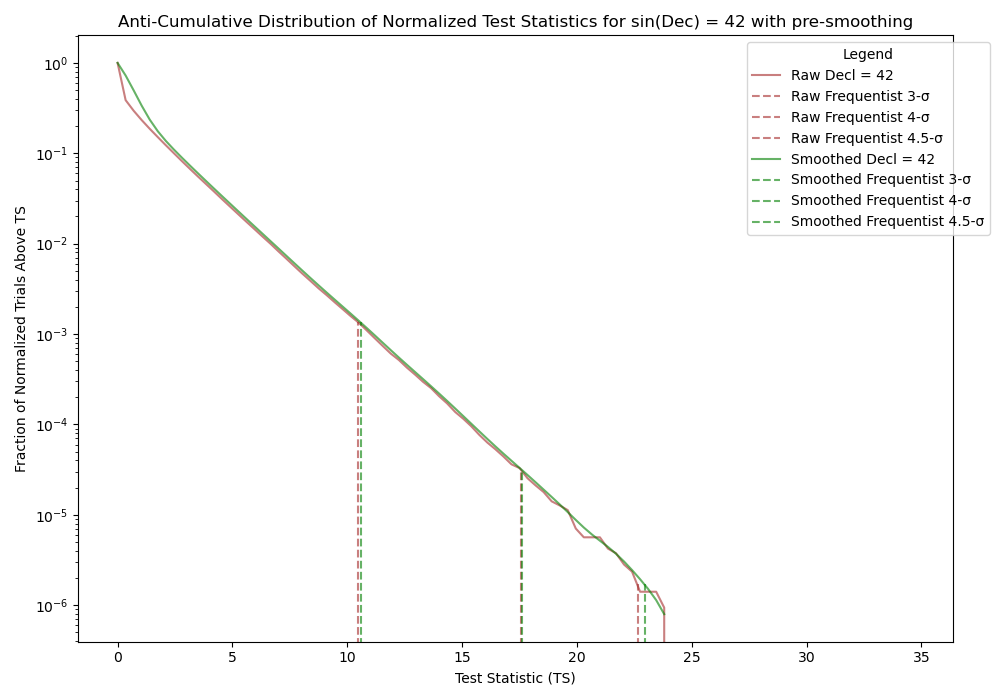

Frequentist Critical Values (Raw Data):
Raw Frequentist critical value at 3-sigma: 10.479443725961538
Raw Frequentist critical value at 4-sigma: 17.55913912361328
Raw Frequentist critical value at 4.5-sigma: 22.64329123891017

Frequentist Critical Values (Smoothed Data):
Smoothed Frequentist critical value at 3-sigma: 10.577943829246616
Smoothed Frequentist critical value at 4-sigma: 17.59117642888108
Smoothed Frequentist critical value at 4.5-sigma: 22.948593111404403
y_data_valid_raw: [1.00000000e+00 3.87072939e-01 2.95558970e-01 2.32820747e-01
 1.86598552e-01 1.51051018e-01 1.22768484e-01 1.00273196e-01
 8.19970398e-02 6.72759660e-02 5.53414484e-02 4.57125108e-02
 3.77406352e-02 3.10686191e-02 2.56724608e-02 2.12260188e-02
 1.75608103e-02 1.45667096e-02 1.20592326e-02 1.00247312e-02
 8.24718980e-03 6.82449779e-03 5.62817523e-03 4.65210404e-03
 3.87134120e-03 3.21105775e-03 2.70137351e-03 2.25239959e-03
 1.88813772e-03 1.58035057e-03 1.33562683e-03 1.09749182e-03
 8.98418473e-04 7.36

In [3]:
##~Working~## Pre-smoothing hist ts  ##
##~~~~~~~~~##========================##
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Access the individual arrays from your data
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Apply Gaussian smoothing only on the y-axis (Test Statistic axis)
sigma_x = 0  # No smoothing along the x-axis (Declination)
sigma_y = 2  # Smoothing along the y-axis (Test Statistic)
smoothed_histogram_2d = gaussian_filter(histogram_2d, sigma=[sigma_x, sigma_y])

# Create a function to find the critical TS value for a given cumulative distribution
def find_critical_ts(cumulative_distribution, p_value, y_edges):
    total_trials = cumulative_distribution[0]
    target = p_value * total_trials
    
    # Find the critical index
    critical_index = np.searchsorted(cumulative_distribution[::-1], target, side='left')
    critical_index = len(cumulative_distribution) - critical_index - 1

    if critical_index == len(cumulative_distribution) - 1:
        critical_value = y_edges[-1]
    elif critical_index == 0:
        critical_value = y_edges[0]
    else:
        x0, x1 = cumulative_distribution[critical_index], cumulative_distribution[critical_index + 1]
        y0, y1 = y_edges[critical_index], y_edges[critical_index + 1]
        slope = (y1 - y0) / (x1 - x0)
        critical_value = y0 + slope * (target - x0)
    
    return critical_value

# Initialize plot
fig, ax = plt.subplots(figsize=(10, 7))

# Plot the anti-cumulative distributions for both raw and smoothed data
for decl in declinations:
    # Find index for the specific declination
    idx = np.abs(x_edges - decl).argmin()
    
    # Raw Data Analysis
    total_counts_raw = np.sum(histogram_2d[idx, :])
    
    if total_counts_raw > 0:
        normalized_histogram_raw = histogram_2d[idx, :] / total_counts_raw
        cumulative_sum_norm_hist_raw = np.cumsum(normalized_histogram_raw[::-1])[::-1]
        total_trials_norm_raw = cumulative_sum_norm_hist_raw[0]
        fraction_above_ts_norm_raw = cumulative_sum_norm_hist_raw / total_trials_norm_raw       
        
        # Use the common x_data (Test Statistic values) for both raw and smoothed
        x_data = y_edges[:-1]
        
        # Plot the anti-cumulative distribution for raw data
        line_raw, = ax.plot(x_data, fraction_above_ts_norm_raw, color='brown', label=f'Raw Decl = {decl}', alpha=0.6)
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask_raw = fraction_above_ts_norm_raw > 0
        x_data_valid_raw = x_data[valid_data_mask_raw]
        y_data_valid_raw = fraction_above_ts_norm_raw[valid_data_mask_raw]
        
        # Critical values for the raw data
        frequentist_critical_values_raw = {}
        for sigma, p_value in [(3, 0.0027/2), (4, 6.33425e-5/2), (4.5, 3.3976731e-6/2)]:
            frequentist_critical_value_raw = find_critical_ts(cumulative_sum_norm_hist_raw, p_value, y_edges[:-1])
            frequentist_critical_values_raw[sigma] = frequentist_critical_value_raw
            y_critical_frequentist_raw = np.interp(frequentist_critical_value_raw, x_data_valid_raw, y_data_valid_raw)
            ax.plot([frequentist_critical_value_raw, frequentist_critical_value_raw], [0, y_critical_frequentist_raw], color='brown', linestyle='--', alpha=0.6, label=f'Raw Frequentist {sigma}-σ')
    
    # Smoothed Data Analysis
    total_counts_smoothed = np.sum(smoothed_histogram_2d[idx, :])
    
    if total_counts_smoothed > 0:
        normalized_histogram_smoothed = smoothed_histogram_2d[idx, :] / total_counts_smoothed
        cumulative_sum_norm_hist_smoothed = np.cumsum(normalized_histogram_smoothed[::-1])[::-1]
        total_trials_norm_smoothed = cumulative_sum_norm_hist_smoothed[0]
        fraction_above_ts_norm_smoothed = cumulative_sum_norm_hist_smoothed / total_trials_norm_smoothed       

        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        max_x_raw = np.max(x_data_valid_raw)
        valid_data_mask_smoothed = (fraction_above_ts_norm_smoothed > 0) & (x_data <= max_x_raw)
        x_data_valid_smoothed = x_data[valid_data_mask_smoothed]
        y_data_valid_smoothed = fraction_above_ts_norm_smoothed[valid_data_mask_smoothed]
        # Plot the anti-cumulative distribution for smoothed data
        line_smoothed, = ax.plot(x_data_valid_smoothed, y_data_valid_smoothed, color='green', label=f'Smoothed Decl = {decl}', alpha=0.6)
        
        # Critical values for the smoothed data
        frequentist_critical_values_smoothed = {}
        for sigma, p_value in [(3, 0.0027/2), (4, 6.33425e-5/2), (4.5, 3.3976731e-6/2)]:
            frequentist_critical_value_smoothed = find_critical_ts(cumulative_sum_norm_hist_smoothed, p_value, y_edges[:-1])
            frequentist_critical_values_smoothed[sigma] = frequentist_critical_value_smoothed
            y_critical_frequentist_smoothed = np.interp(frequentist_critical_value_smoothed, x_data_valid_smoothed, y_data_valid_smoothed)
            ax.plot([frequentist_critical_value_smoothed, frequentist_critical_value_smoothed], [0, y_critical_frequentist_smoothed], color='green', linestyle='--', alpha=0.6, label=f'Smoothed Frequentist {sigma}-σ')

# Finalize the plot
ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS')
ax.set_title(f'Anti-Cumulative Distribution of Normalized Test Statistics for sin(Dec) = {declinations_str} with pre-smoothing')
ax.set_yscale('log')
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax.grid(False)
plt.tight_layout()

# Display the plot
plt.show()

# Print the frequentist critical values for all sigma levels for both raw and smoothed data
print("Frequentist Critical Values (Raw Data):")
for sigma, critical_value in frequentist_critical_values_raw.items():
    print(f"Raw Frequentist critical value at {sigma}-sigma: {critical_value}")

print("\nFrequentist Critical Values (Smoothed Data):")
for sigma, critical_value in frequentist_critical_values_smoothed.items():
    print(f"Smoothed Frequentist critical value at {sigma}-sigma: {critical_value}")

print('y_data_valid_raw:',y_data_valid_raw)
print('x_data_valid_raw:',x_data_valid_raw)
print('x_data_valid_smoothed:',x_data_valid_smoothed)
print('y_data_valid_smoothed:',y_data_valid_smoothed)

In [4]:
import numpy as np

# Define mu threshold
mu_threshold = 0.5

# Assuming these are your arrays
fraction_above_ts_norm_smoothed = np.array([1.00000000e+00, 7.25111525e-01, 4.96738455e-01, 3.36049147e-01, 
                                           2.35719627e-01, 1.75412146e-01, 1.37060880e-01, 1.10054768e-01, 
                                           8.94695891e-02, 7.31567051e-02, 6.00198120e-02, 4.93552103e-02, 
                                           4.06538251e-02, 3.35261530e-02, 2.76735274e-02, 2.28624452e-02, 
                                           1.89041761e-02, 1.56426790e-02, 1.29489793e-02, 1.07184765e-02, 
                                           8.86855853e-03, 7.33500101e-03, 6.06705155e-03, 5.02262878e-03, 
                                           4.16509871e-03, 3.46188016e-03, 2.88429264e-03, 2.40785970e-03, 
                                           2.01238011e-03, 1.68155751e-03, 1.40262393e-03, 1.16632074e-03, 
                                           9.66652260e-04, 7.99701179e-04, 6.61925110e-04, 5.49157037e-04, 
                                           4.56827797e-04, 3.80728384e-04, 3.17453869e-04, 2.64398587e-04, 
                                           2.19647583e-04, 1.81880167e-04, 1.50176472e-04, 1.23763709e-04, 
                                           1.01893400e-04, 8.38830321e-05, 6.91598565e-05, 5.72160417e-05, 
                                           4.75471496e-05, 3.96559565e-05, 3.31081700e-05, 2.75922488e-05, 
                                           2.29320558e-05, 1.90296213e-05, 1.57820719e-05, 1.30545284e-05, 
                                           1.07334758e-05, 8.78755481e-06, 7.24081020e-06, 6.07470307e-06, 
                                           5.18161525e-06, 4.42395991e-06, 3.71726914e-06, 3.05044362e-06, 
                                           2.45078325e-06, 1.94092442e-06, 1.51426937e-06, 1.14052457e-06, 
                                           7.97386308e-07])
x_data_valid = np.array([0., 0.35, 0.7, 1.05, 1.4, 1.75, 2.1, 2.45, 2.8, 3.15, 3.5, 3.85, 
                         4.2, 4.55, 4.9, 5.25, 5.6, 5.95, 6.3, 6.65, 7., 7.35, 7.7, 8.05, 
                         8.4, 8.75, 9.1, 9.45, 9.8, 10.15, 10.5, 10.85, 11.2, 11.55, 11.9, 
                         12.25, 12.6, 12.95, 13.3, 13.65, 14., 14.35, 14.7, 15.05, 15.4, 
                         15.75, 16.1, 16.45, 16.8, 17.15, 17.5, 17.85, 18.2, 18.55, 18.9, 
                         19.25, 19.6, 19.95, 20.3, 20.65, 21., 21.35, 21.7, 22.05, 22.4, 
                         22.75, 23.1, 23.45, 23.8])
y_data_valid = fraction_above_ts_norm_smoothed

# Apply the filter
valid_data_mask = fraction_above_ts_norm_smoothed >= mu_threshold
x_data_valid_filtered = x_data_valid[valid_data_mask]
y_data_valid_filtered = fraction_above_ts_norm_smoothed[valid_data_mask]

print("Filtered x_data:", x_data_valid_filtered)
print("Filtered y_data:", y_data_valid_filtered)

Filtered x_data: [0.   0.35]
Filtered y_data: [1.         0.72511152]


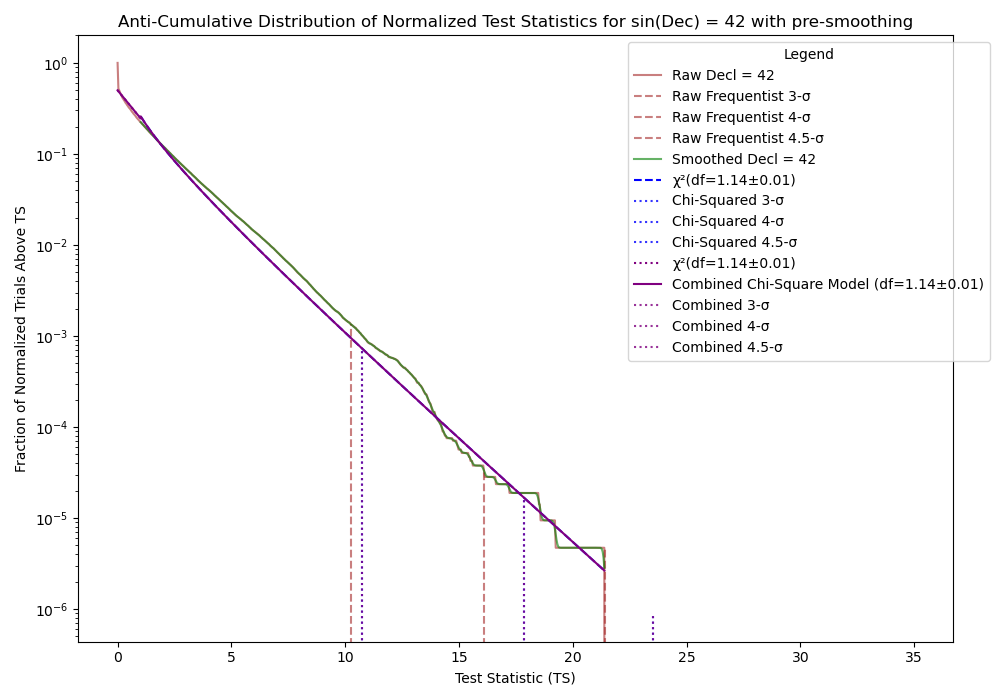

Frequentist Critical Values:
Frequentist critical value at 3-sigma: 10.242226575000002
Frequentist critical value at 4-sigma: 16.10963019658125
Frequentist critical value at 4.5-sigma: 21.407374832859013

Fitted Critical Values:
Fitted critical value at 3-sigma: 10.758341804066866
Fitted critical value at 4-sigma: 17.87687034808181
Fitted critical value at 4.5-sigma: 23.512244978743464

Combined Critical Values:
Combined critical value at 3-sigma: 10.758341804066866
Combined critical value at 4-sigma: 17.87687034808181
Combined critical value at 4.5-sigma: 23.512244978743464
combined_y: [5.00147892e-01 2.45191377e-01 2.58498439e-01 2.50357787e-01
 2.42588813e-01 2.35165608e-01 2.28064828e-01 2.21265373e-01
 2.14748102e-01 2.08495600e-01 2.02491978e-01 1.96722698e-01
 1.91174424e-01 1.85834893e-01 1.80692803e-01 1.75737713e-01
 1.70959959e-01 1.66350580e-01 1.61901248e-01 1.57604210e-01
 1.53452239e-01 1.49438585e-01 1.45556932e-01 1.41801365e-01
 1.38166336e-01 1.34646630e-01 1.3123734

In [11]:
##~Working~## TS pre smoothing chi fit ann cut ##
##~~~~~~~~~##==================================##
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Access the individual arrays from your data
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Apply Gaussian smoothing only on the y-axis (Test Statistic axis)
sigma_x = 0  # No smoothing along the x-axis (Declination)
sigma_y = 2  # Smoothing along the y-axis (Test Statistic)
smoothed_histogram_2d = gaussian_filter(histogram_2d, sigma=[sigma_x, sigma_y])
def exponential_decay(x, a, b):
    return a * np.exp(-b * x)
# Mu Threshold
mu = 1.0
# Define your combined chi-square model function if needed
def combined_chi_squared_model(x, df):
    return chi2.pdf(x, df)
# Create a function to find the critical TS value for a given cumulative distribution
def find_critical_ts(cumulative_distribution, p_value, y_edges):
    total_trials = cumulative_distribution[0]
    target = p_value * total_trials
    
    # Find the critical index
    critical_index = np.searchsorted(cumulative_distribution[::-1], target, side='left')
    critical_index = len(cumulative_distribution) - critical_index - 1

    if critical_index == len(cumulative_distribution) - 1:
        critical_value = y_edges[-1]
    elif critical_index == 0:
        critical_value = y_edges[0]
    else:
        x0, x1 = cumulative_distribution[critical_index], cumulative_distribution[critical_index + 1]
        y0, y1 = y_edges[critical_index], y_edges[critical_index + 1]
        slope = (y1 - y0) / (x1 - x0)
        critical_value = y0 + slope * (target - x0)
    
    return critical_value
# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)
# Initialize plot
fig, ax = plt.subplots(figsize=(10, 7))

# Plot the anti-cumulative distributions for both raw and smoothed data
for decl in declinations:
    # Find index for the specific declination
    idx = np.abs(x_edges - decl).argmin()
    
    # Raw Data Analysis
    total_counts_raw = np.sum(histogram_2d[idx, :])
    
    if total_counts_raw > 0:
        normalized_histogram_raw = histogram_2d[idx, :] / total_counts_raw
        cumulative_sum_norm_hist_raw = np.cumsum(normalized_histogram_raw[::-1])[::-1]
        total_trials_norm_raw = cumulative_sum_norm_hist_raw[0]
        fraction_above_ts_norm_raw = cumulative_sum_norm_hist_raw / total_trials_norm_raw       
        
        # Use the common x_data (Test Statistic values) for both raw and smoothed
        x_data = y_edges[:-1]
        
        # Plot the anti-cumulative distribution for raw data
        line_raw, = ax.plot(x_data, fraction_above_ts_norm_raw, color='brown', label=f'Raw Decl = {decl}', alpha=0.6)
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask_raw = fraction_above_ts_norm_raw > 0
        x_data_valid_raw = x_data[valid_data_mask_raw]
        y_data_valid_raw = fraction_above_ts_norm_raw[valid_data_mask_raw]
        
        # Critical values for the raw data
        frequentist_critical_values_raw = {}
        for sigma, p_value in [(3, 0.0027/2), (4, 6.33425e-5/2), (4.5, 3.3976731e-6/2)]:
            frequentist_critical_value_raw = find_critical_ts(cumulative_sum_norm_hist_raw, p_value, y_edges[:-1])
            frequentist_critical_values_raw[sigma] = frequentist_critical_value_raw
            y_critical_frequentist_raw = np.interp(frequentist_critical_value_raw, x_data_valid_raw, y_data_valid_raw)
            ax.plot([frequentist_critical_value_raw, frequentist_critical_value_raw], [0, y_critical_frequentist_raw], color='brown', linestyle='--', alpha=0.6, label=f'Raw Frequentist {sigma}-σ')
    
    # Smoothed Data Analysis
    total_counts_smoothed = np.sum(smoothed_histogram_2d[idx, :])
    
    if total_counts_smoothed > 0:
        normalized_histogram_smoothed = smoothed_histogram_2d[idx, :] / total_counts_smoothed
        cumulative_sum_norm_hist_smoothed = np.cumsum(normalized_histogram_smoothed[::-1])[::-1]
        total_trials_norm_smoothed = cumulative_sum_norm_hist_smoothed[0]
        fraction_above_ts_norm_smoothed = cumulative_sum_norm_hist_smoothed / total_trials_norm_smoothed       

        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        max_x_raw = np.max(x_data_valid_raw)
        # Ensure x_data_valid_smoothed_no_cut is properly filtered
        valid_data_mask_smoothed = (fraction_above_ts_norm_smoothed > 0) & (x_data <= max_x_raw)
        x_data_valid_smoothed_no_cut = x_data[valid_data_mask_smoothed]
        y_data_valid_smoothed_no_cut = fraction_above_ts_norm_smoothed[valid_data_mask_smoothed]
        
        # Apply the mu filter correctly
        filtered_mask = x_data_valid_smoothed_no_cut >= mu
        x_data_valid_smoothed = x_data_valid_smoothed_no_cut[filtered_mask]
        y_data_valid_smoothed = y_data_valid_smoothed_no_cut[filtered_mask]
        # Plot the anti-cumulative distribution for smoothed data
        line_smoothed, = ax.plot(x_data_valid_smoothed, y_data_valid_smoothed, color='green', label=f'Smoothed Decl = {decl}', alpha=0.6)

        # Extract the data that was actually plotted
        x_data_plotted = line_smoothed.get_xdata()
        y_data_plotted = line_smoothed.get_ydata()
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask = y_data_plotted > 0
        x_data_valid = x_data_plotted[valid_data_mask]
        y_data_valid = y_data_plotted[valid_data_mask]

        # Fit the chi-squared model to the valid data
        popt, pcov = curve_fit(chi_squared_model, x_data_valid, y_data_valid, p0=[2.0], maxfev=10000)
        df = popt[0]
        df_err = np.sqrt(np.diag(pcov))[0]  # Uncertainty in the degree of freedom
        
        # Calculate the chi-squared fit using the valid data
        chi_squared_fit = chi_squared_model(x_data_valid, df)
        fitted_critical_values = {}
        # Plot the chi-squared fit
        ax.plot(x_data_valid, chi_squared_fit, color='blue', linestyle='--', label=f'\u03C7²(df={df:.2f}±{df_err:.2f})')
        # Compute chi-square critical values based on fitted model for raw data
        for sigma, p_value in [(3, 0.0027/2), (4, 6.33425e-5/2), (4.5, 3.3976731e-6/2)]:
            critical_ts_chi2 = chi2.ppf(1 - p_value, df)
            fitted_critical_values[sigma] = critical_ts_chi2
            y_critical_chi2 = chi_squared_model(critical_ts_chi2, df)
            ax.plot([critical_ts_chi2, critical_ts_chi2], [0, y_critical_chi2], color='blue', linestyle=':', alpha=0.8, label=f'Chi-Squared {sigma}-σ')
        

        # Extension to Zero
        popt, _ = curve_fit(exponential_decay, x_data_valid, chi_squared_fit, p0=[1, 1])
        x_min = np.min(x_data_valid)
        x_zero = 0
        x_extended = np.linspace(x_zero, x_min, 2)
        y_extrapolated = exponential_decay(x_extended, *popt)
        ax.plot(x_extended, y_extrapolated, color='purple', linestyle=':', label=f'\u03C7²(df={df:.2f}±{df_err:.2f})')
        
        # Combine chi-square fit and extrapolated model
        combined_x = np.concatenate([x_extended,x_data_valid])
        combined_y = np.concatenate([y_extrapolated, chi_squared_fit])
        # Plot the final combined model
        ax.plot(combined_x, combined_y, color='purple', linestyle='-', label=f'Combined Chi-Square Model (df={df:.2f}±{df_err:.2f})')
        # Assuming df_combined is the degrees of freedom from your model
        df_combined = df  # or use the fitted df if it's stored in a variable
        # Calculate critical values based on df_combined
        combined_critical_values = {}
        for sigma, p_value in [(3, 0.0027/2), (4, 6.33425e-5/2), (4.5, 3.3976731e-6/2)]:
            critical_ts_combined = chi2.ppf(1 - p_value, df_combined)
            combined_critical_values[sigma] = critical_ts_combined
            y_critical_combined = chi2.pdf(critical_ts_combined, df_combined)
            ax.plot([critical_ts_combined, critical_ts_combined], [0, y_critical_combined], color='purple', linestyle=':', alpha=0.8, label=f'Combined {sigma}-σ')                

# # Finalize the plot

ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS')
ax.set_title(f'Anti-Cumulative Distribution of Normalized Test Statistics for sin(Dec) = {declinations_str} with pre-smoothing')
ax.set_yscale('log')
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax.grid(False)
plt.tight_layout()

# Display the plot
plt.show()

# Print the frequentist critical values for all sigma levels for both raw and smoothed data
print("Frequentist Critical Values:")
for sigma, critical_value in frequentist_critical_values_raw.items():
    print(f"Frequentist critical value at {sigma}-sigma: {critical_value}")

# Print critical values for the raw data
print("\nFitted Critical Values:")
for sigma, critical_value in fitted_critical_values.items():
    print(f"Fitted critical value at {sigma}-sigma: {critical_value}")
print("\nCombined Critical Values:")
for sigma, critical_value in combined_critical_values.items():
    print(f"Combined critical value at {sigma}-sigma: {critical_value}")


print('combined_y:',combined_y)
print('combined_x:',combined_x)
print('y_extrapolated:',y_extrapolated)
print('x_extended:',x_extended)
print('y_data_valid_raw:',y_data_valid_raw)
print('x_data_valid_raw:',x_data_valid_raw)
print('x_data_valid:',x_data_valid)
print('chi_squared_fit_y:',chi_squared_fit)


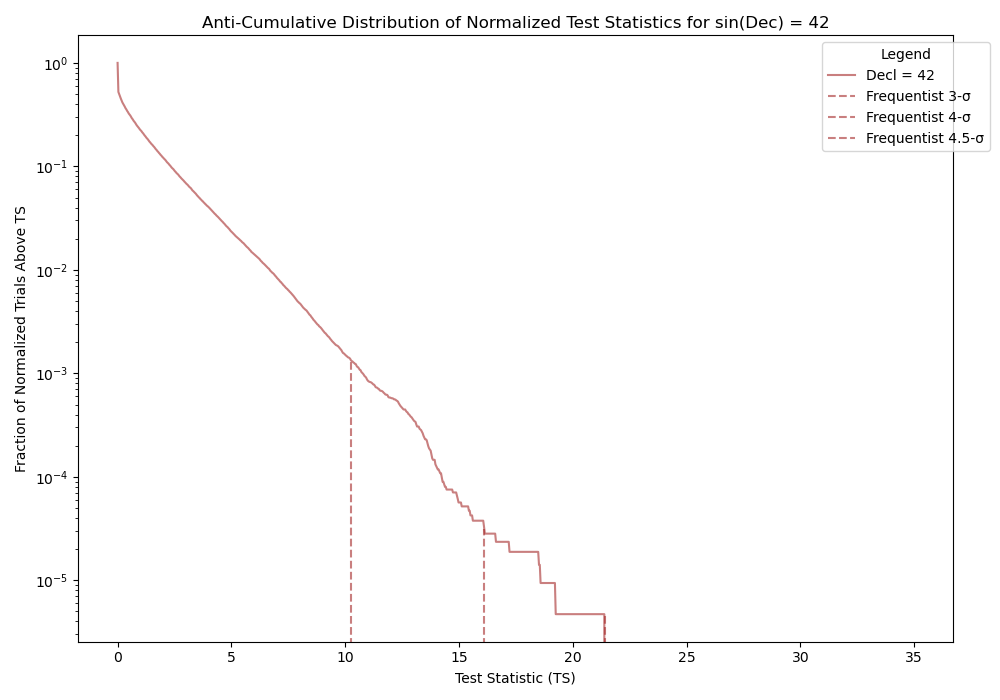

Frequentist critical value at 3-sigma: 10.242226575000002
Frequentist critical value at 4-sigma: 16.10963019658125
Frequentist critical value at 4.5-sigma: 21.407374832859013
Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Anti-Cumulative_Distribution_of_Normalized_Test_Statistics_for_sin(Dec)_=_42.png


In [67]:
##~Working~## TS Unfitted raw Dist.  ##
##~~~~~~~~~##========================##
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Create a function to find the critical TS value for a given cumulative distribution
def find_critical_ts(cumulative_distribution, p_value, y_edges):
    total_trials = cumulative_distribution[0]
    target = p_value * total_trials
    
    # Find the critical index
    critical_index = np.searchsorted(cumulative_distribution[::-1], target, side='left')
    critical_index = len(cumulative_distribution) - critical_index - 1

    if critical_index == len(cumulative_distribution) - 1:
        critical_value = y_edges[-1]
    elif critical_index == 0:
        critical_value = y_edges[0]
    else:
        x0, x1 = cumulative_distribution[critical_index], cumulative_distribution[critical_index + 1]
        y0, y1 = y_edges[critical_index], y_edges[critical_index + 1]
        slope = (y1 - y0) / (x1 - x0)
        critical_value = y0 + slope * (target - x0)
    
    return critical_value

# Initialize plot
fig, ax = plt.subplots(figsize=(10, 7))

# Plot the anti-cumulative distributions and fit the chi-square model
for decl in declinations:
    # Find index and plot
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        color = 'brown'
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        total_trials_norm = cumulative_sum_norm_hist[0]
        fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm       
        
        frequentist_critical_value = find_critical_ts(cumulative_sum_norm_hist, 0.0027/2, y_edges[:-1])

        # Calculate the number of TS values above the 3-sigma threshold
        N_2 = np.sum(histogram_2d[idx, :] >= frequentist_critical_value)
        N = total_counts
        
        # Plot the anti-cumulative distribution and store the line object
        line, = ax.plot(y_edges[:-1], fraction_above_ts_norm, color=color, label=f'Decl = {decl}', alpha=0.6)
        
        # Extract the data that was actually plotted
        x_data_plotted = line.get_xdata()
        y_data_plotted = line.get_ydata()
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask = y_data_plotted > 0
        x_data_valid = x_data_plotted[valid_data_mask]
        y_data_valid = y_data_plotted[valid_data_mask]     
        frequentist_critical_values = {}
        # Plot the Frequentist and Fitted critical values for 3, 4, and 4.5 sigma
        for sigma, p_value in [(3, 0.0027/2), (4, 6.33425e-5/2), (4.5, 3.3976731e-6/2)]:
            frequentist_critical_value = find_critical_ts(cumulative_sum_norm_hist, p_value, y_edges[:-1])
            frequentist_critical_values[sigma] = frequentist_critical_value
            # Plot the frequentist critical value
            y_critical_frequentist= np.interp(frequentist_critical_value, x_data_valid, y_data_valid)
            ax.plot([frequentist_critical_value, frequentist_critical_value], [0, y_critical_frequentist], color=color, linestyle='--', alpha=0.6, label=f'Frequentist {sigma}-σ')

# Finalize the plot
ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS')
ax.set_title(f'TS Anti-Cumulative Distribution of Normalized Test Statistics for sin(Dec) = {declinations_str}')
ax.set_yscale('log')
#ax.set_xscale('log')
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax.grid(False)
plt.tight_layout()

# Display the plot
plt.show()
# Print the frequentist critical values for all sigma levels
for sigma, critical_value in frequentist_critical_values.items():
    print(f"Frequentist critical value at {sigma}-sigma: {critical_value}")
# # Print the data points
# for i, ts in enumerate(y_edges[:-1]):
#     print(f"TS: {ts:.2f}, Fraction of Trials Above TS: {fraction_above_ts_norm[i]:.6f}")
# print(y_data_valid)
# print(x_data_valid)
save_plot(fig, ax, datapick)

mu cut at 0.5 TS
Error Empirical/Fit for Decl = 42: -1.4330


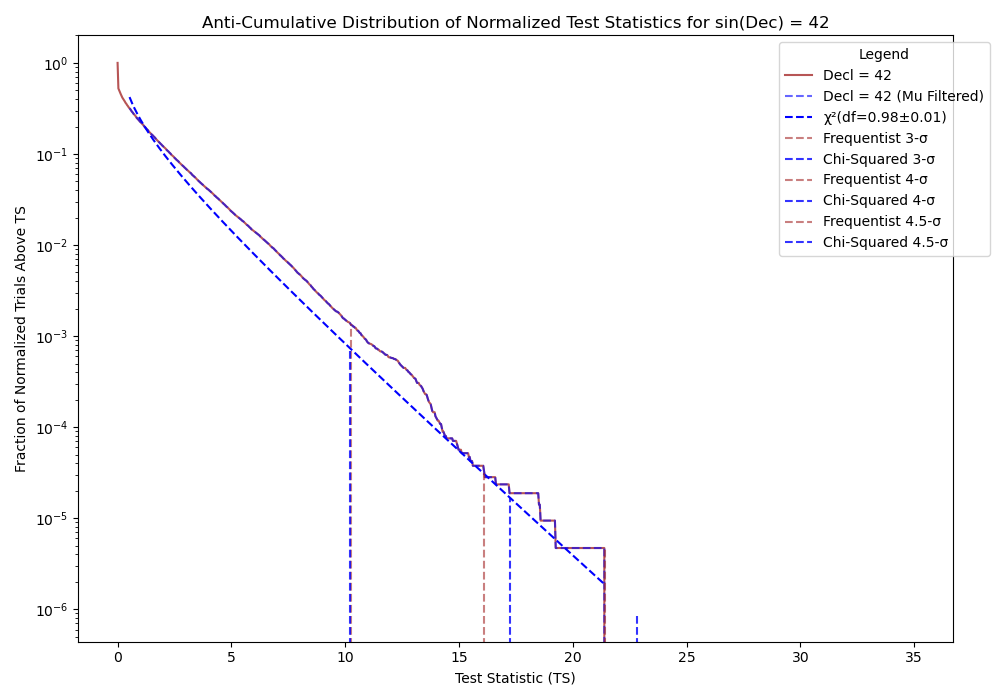

Frequentist critical value at 3-sigma: 10.242226575000002
Frequentist critical value at 4-sigma: 16.10963019658125
Frequentist critical value at 4.5-sigma: 21.407374832859013


In [14]:
##~Working~##    TS manual One(dec) cut     ##
##~~~~~~~~~##================================##
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Create a function to find the critical TS value for a given cumulative distribution
def find_critical_ts(cumulative_distribution, p_value, y_edges):
    total_trials = cumulative_distribution[0]
    target = p_value * total_trials
    
    # Find the critical index
    critical_index = np.searchsorted(cumulative_distribution[::-1], target, side='left')
    critical_index = len(cumulative_distribution) - critical_index - 1

    if critical_index == len(cumulative_distribution) - 1:
        critical_value = y_edges[-1]
    elif critical_index == 0:
        critical_value = y_edges[0]
    else:
        x0, x1 = cumulative_distribution[critical_index], cumulative_distribution[critical_index + 1]
        y0, y1 = y_edges[critical_index], y_edges[critical_index + 1]
        slope = (y1 - y0) / (x1 - x0)
        critical_value = y0 + slope * (target - x0)
    
    return critical_value
# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)
# Initialize plot

fig, ax = plt.subplots(figsize=(10, 7))
mu = 0.5
print(f'mu cut at {mu} TS')
# Plot the anti-cumulative distributions and fit the chi-square model
for decl in declinations:
    # Find index and plot
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        color = 'brown'
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        total_trials_norm = cumulative_sum_norm_hist[0]
        fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm       
        
        # Find the empirical critical value (frequentist) for 3-sigma
        frequentist_critical_value = find_critical_ts(cumulative_sum_norm_hist, 0.0027/2, y_edges[:-1])

        # Apply the mu filter to y_edges and fraction_above_ts_norm
        filtered_mask = y_edges[:-1] >= mu
        filtered_y_edges = y_edges[:-1][filtered_mask]
        filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

        # Calculate the number of TS values above the 3-sigma threshold
        N_2 = np.sum(histogram_2d[idx, :] >= frequentist_critical_value)
        N = total_counts
        
        # Plot the anti-cumulative distribution
        ax.plot(y_edges[:-1], fraction_above_ts_norm, color='brown', label=f'Decl = {decl}', alpha=0.8)
        
        # Plot the anti-cumulative distribution after the mu filter
        line, = ax.plot(filtered_y_edges, filtered_fraction_above_ts_norm, color='blue', linestyle='--', alpha=0.6, label=f'Decl = {decl} (Mu Filtered)')
        
        # Extract the data that was actually plotted
        x_data_plotted = line.get_xdata()
        y_data_plotted = line.get_ydata()
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask = y_data_plotted > 0
        x_data_valid = x_data_plotted[valid_data_mask]
        y_data_valid = y_data_plotted[valid_data_mask]

        # Fit the chi-squared model to the valid data
        popt, pcov = curve_fit(chi_squared_model, x_data_valid, y_data_valid, p0=[2.0], maxfev=10000)
        df = popt[0]
        df_err = np.sqrt(np.diag(pcov))[0]  # Uncertainty in the degree of freedom
        
        # Calculate the chi-squared fit using the valid data
        chi_squared_fit = chi_squared_model(x_data_valid, df)
        
        # Plot the chi-squared fit
        ax.plot(x_data_valid, chi_squared_fit, color='blue', linestyle='--', label=f'\u03C7²(df={df:.2f}±{df_err:.2f})')
        
        # Plot the Frequentist and Fitted critical values for 3, 4, and 4.5 sigma
        for sigma, p_value in [(3, 0.0027/2), (4, 6.33425e-5/2), (4.5, 3.3976731e-6/2)]:
            # Frequentist critical value
            frequentist_critical_value = find_critical_ts(cumulative_sum_norm_hist, p_value, y_edges[:-1])
            y_critical_frequentist = np.interp(frequentist_critical_value, x_data_valid, y_data_valid)
            ax.plot([frequentist_critical_value, frequentist_critical_value], [0, y_critical_frequentist], color='brown', linestyle='--', alpha=0.6, label=f'Frequentist {sigma}-σ')

            # Chi-squared critical value
            critical_ts_chi2 = chi2.ppf(1 - p_value, df)
            y_critical_chi2 = chi_squared_model(critical_ts_chi2, df)
            ax.plot([critical_ts_chi2, critical_ts_chi2], [0, y_critical_chi2], color='blue', linestyle='--', alpha=0.8, label=f'Chi-Squared {sigma}-σ')
  
        # Calculate and print the distance between the empirical and chi-squared 3-sigma critical values
        distance_between_lines = frequentist_critical_value - critical_ts_chi2
        print(f'Error Empirical/Fit for Decl = {decl}: {distance_between_lines:.4f}')
# Finalize the plot
ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS')
ax.set_title(f'TS Anti-Cumulative Distribution of Normalized Test Statistics for sin(Dec) = {declinations_str}')
ax.set_yscale('log')
#ax.set_xscale('log')
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax.grid(False)
plt.tight_layout()

# Display the plot
plt.show()
# Print the frequentist critical values for all sigma levels
for sigma, critical_value in frequentist_critical_values.items():
    print(f"Frequentist critical value at {sigma}-sigma: {critical_value}")
# # Print the data points
# for i, ts in enumerate(y_edges[:-1]):
#     print(f"TS: {ts:.2f}, Fraction of Trials Above TS: {fraction_above_ts_norm[i]:.6f}")

# print('y_data_valid_raw:',filtered_fraction_above_ts_norm)
# print('x_data_valid_raw:',filtered_y_edges)
# print('x_data_valid_smoothed:',x_data_valid)
# print('y_data_valid_smoothed:',chi_squared_fit)

mu cut at 0.5 TS
Error Empirical/Fit for Decl = 42: -1.4330


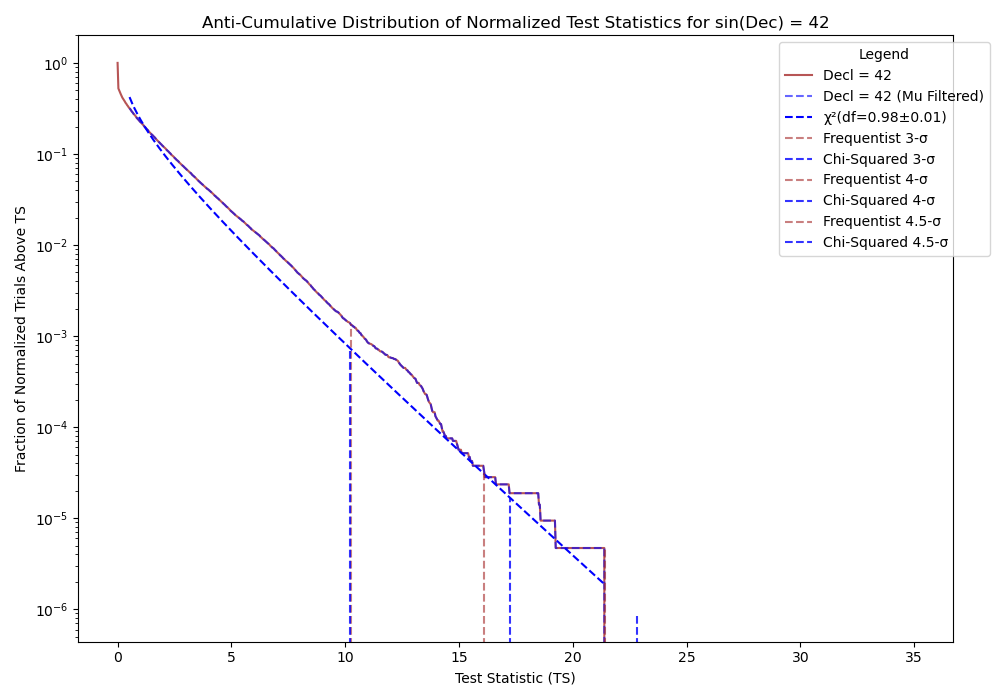

Frequentist critical value at 3-sigma: 10.242226575000002
Frequentist critical value at 4-sigma: 16.10963019658125
Frequentist critical value at 4.5-sigma: 21.407374832859013


In [13]:
##~Working~## TS manual One(dec) cut and fit.##
##~~~~~~~~~##================================##
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Create a function to find the critical TS value for a given cumulative distribution
def find_critical_ts(cumulative_distribution, p_value, y_edges):
    total_trials = cumulative_distribution[0]
    target = p_value * total_trials
    
    # Find the critical index
    critical_index = np.searchsorted(cumulative_distribution[::-1], target, side='left')
    critical_index = len(cumulative_distribution) - critical_index - 1

    if critical_index == len(cumulative_distribution) - 1:
        critical_value = y_edges[-1]
    elif critical_index == 0:
        critical_value = y_edges[0]
    else:
        x0, x1 = cumulative_distribution[critical_index], cumulative_distribution[critical_index + 1]
        y0, y1 = y_edges[critical_index], y_edges[critical_index + 1]
        slope = (y1 - y0) / (x1 - x0)
        critical_value = y0 + slope * (target - x0)
    
    return critical_value
# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)
# Initialize plot

fig, ax = plt.subplots(figsize=(10, 7))
mu = 0.5
print(f'mu cut at {mu} TS')
# Plot the anti-cumulative distributions and fit the chi-square model
for decl in declinations:
    # Find index and plot
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        color = 'brown'
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        total_trials_norm = cumulative_sum_norm_hist[0]
        fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm       
        
        # Find the empirical critical value (frequentist) for 3-sigma
        frequentist_critical_value = find_critical_ts(cumulative_sum_norm_hist, 0.0027/2, y_edges[:-1])

        # Apply the mu filter to y_edges and fraction_above_ts_norm
        filtered_mask = y_edges[:-1] >= mu
        filtered_y_edges = y_edges[:-1][filtered_mask]
        filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

        # Calculate the number of TS values above the 3-sigma threshold
        N_2 = np.sum(histogram_2d[idx, :] >= frequentist_critical_value)
        N = total_counts
        
        # Plot the anti-cumulative distribution
        ax.plot(y_edges[:-1], fraction_above_ts_norm, color='brown', label=f'Decl = {decl}', alpha=0.8)
        
        # Plot the anti-cumulative distribution after the mu filter
        line, = ax.plot(filtered_y_edges, filtered_fraction_above_ts_norm, color='blue', linestyle='--', alpha=0.6, label=f'Decl = {decl} (Mu Filtered)')
        
        # Extract the data that was actually plotted
        x_data_plotted = line.get_xdata()
        y_data_plotted = line.get_ydata()
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask = y_data_plotted > 0
        x_data_valid = x_data_plotted[valid_data_mask]
        y_data_valid = y_data_plotted[valid_data_mask]

        # Fit the chi-squared model to the valid data
        popt, pcov = curve_fit(chi_squared_model, x_data_valid, y_data_valid, p0=[2.0], maxfev=10000)
        df = popt[0]
        df_err = np.sqrt(np.diag(pcov))[0]  # Uncertainty in the degree of freedom
        
        # Calculate the chi-squared fit using the valid data
        chi_squared_fit = chi_squared_model(x_data_valid, df)
        
        # Plot the chi-squared fit
        ax.plot(x_data_valid, chi_squared_fit, color='blue', linestyle='--', label=f'\u03C7²(df={df:.2f}±{df_err:.2f})')
        
        # Plot the Frequentist and Fitted critical values for 3, 4, and 4.5 sigma
        for sigma, p_value in [(3, 0.0027/2), (4, 6.33425e-5/2), (4.5, 3.3976731e-6/2)]:
            # Frequentist critical value
            frequentist_critical_value = find_critical_ts(cumulative_sum_norm_hist, p_value, y_edges[:-1])
            y_critical_frequentist = np.interp(frequentist_critical_value, x_data_valid, y_data_valid)
            ax.plot([frequentist_critical_value, frequentist_critical_value], [0, y_critical_frequentist], color='brown', linestyle='--', alpha=0.6, label=f'Frequentist {sigma}-σ')

            # Chi-squared critical value
            critical_ts_chi2 = chi2.ppf(1 - p_value, df)
            y_critical_chi2 = chi_squared_model(critical_ts_chi2, df)
            ax.plot([critical_ts_chi2, critical_ts_chi2], [0, y_critical_chi2], color='blue', linestyle='--', alpha=0.8, label=f'Chi-Squared {sigma}-σ')
  
        # Calculate and print the distance between the empirical and chi-squared 3-sigma critical values
        distance_between_lines = frequentist_critical_value - critical_ts_chi2
        print(f'Error Empirical/Fit for Decl = {decl}: {distance_between_lines:.4f}')
# Finalize the plot
ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS')
ax.set_title(f'TS Anti-Cumulative Distribution of Normalized Test Statistics for sin(Dec) = {declinations_str}')
ax.set_yscale('log')
#ax.set_xscale('log')
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax.grid(False)
plt.tight_layout()

# Display the plot
plt.show()
# Print the frequentist critical values for all sigma levels
for sigma, critical_value in frequentist_critical_values.items():
    print(f"Frequentist critical value at {sigma}-sigma: {critical_value}")
# # Print the data points
# for i, ts in enumerate(y_edges[:-1]):
#     print(f"TS: {ts:.2f}, Fraction of Trials Above TS: {fraction_above_ts_norm[i]:.6f}")

# print('y_data_valid_raw:',filtered_fraction_above_ts_norm)
# print('x_data_valid_raw:',filtered_y_edges)
# print('x_data_valid_smoothed:',x_data_valid)
# print('y_data_valid_smoothed:',chi_squared_fit)




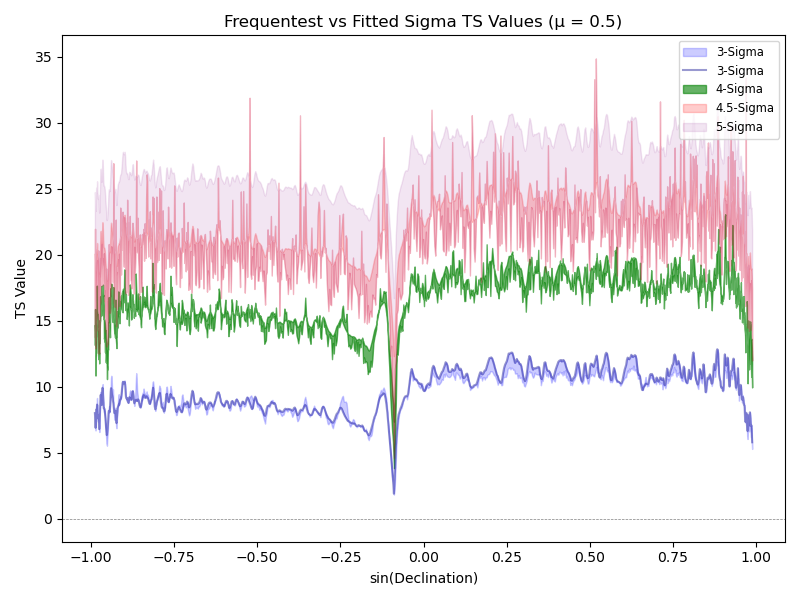

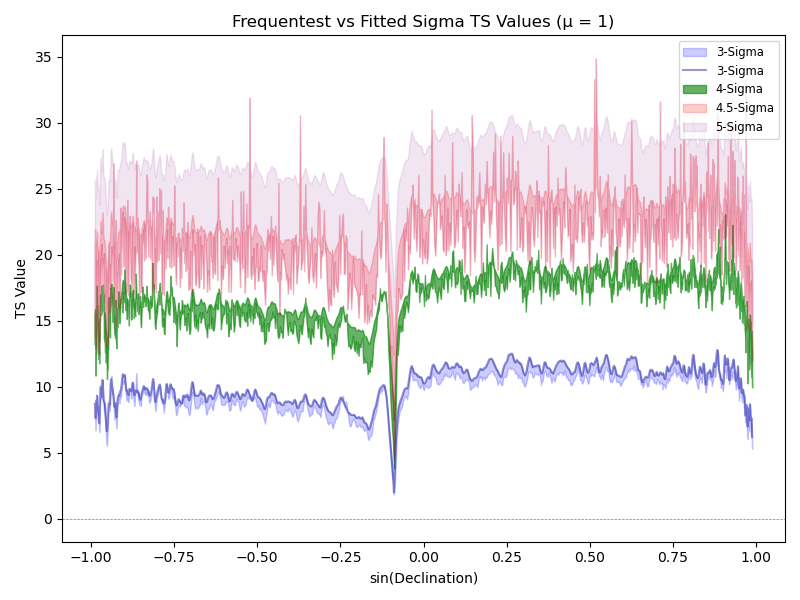

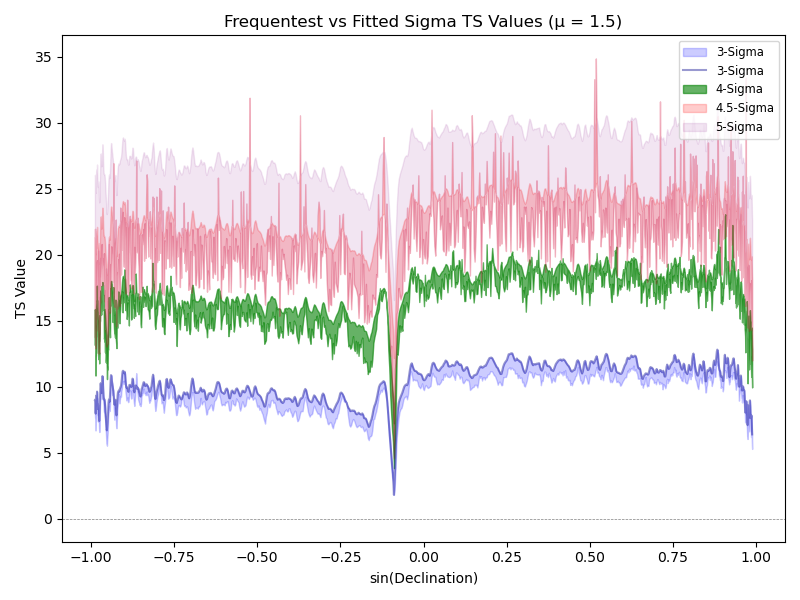

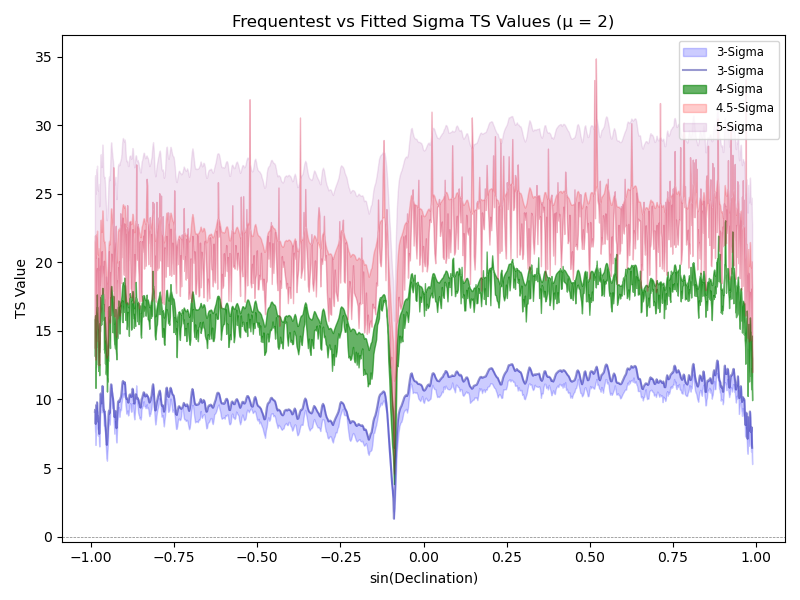

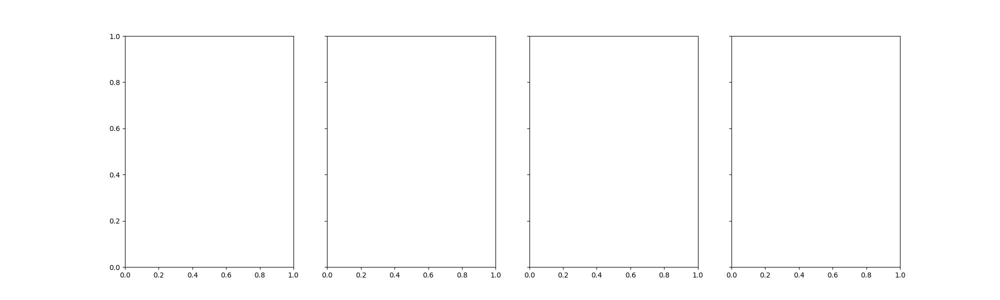

In [145]:
##~Working~## TS manual Sin(dec) Diff.##
##~~~~~~~~~##=========================##


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Function to find the critical TS value for a given cumulative distribution
def find_critical_ts(cumulative_distribution, p_value, y_edges):
    total_trials = cumulative_distribution[0]
    target = p_value * total_trials
    
    # Find the critical index
    critical_index = np.searchsorted(cumulative_distribution[::-1], target, side='left')
    critical_index = len(cumulative_distribution) - critical_index - 1

    if critical_index == len(cumulative_distribution) - 1:
        critical_value = y_edges[-1]
    elif critical_index == 0:
        critical_value = y_edges[0]
    else:
        x0, x1 = cumulative_distribution[critical_index], cumulative_distribution[critical_index + 1]
        y0, y1 = y_edges[critical_index], y_edges[critical_index + 1]
        slope = (y1 - y0) / (x1 - x0)
        critical_value = y0 + slope * (target - x0)
    
    return critical_value

# Define Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)

# Convert declination edges to sine of declination
sin_x_edges = np.sin(np.radians(x_edges))

# List of mu values to investigate
mu_values = [0.5, 1, 1.5, 2]

# Plotting for each mu value
fig, axs = plt.subplots(1, len(mu_values), figsize=(20, 6), sharey=True)

# Loop over mu values
for i, mu in enumerate(mu_values):
    sin_x_midpoints = []
    empirical_3sigma = []
    theoretical_3sigma = []
    empirical_4sigma = []
    theoretical_4sigma = []
    empirical_4_5sigma = []
    theoretical_4_5sigma = []
    empirical_5sigma = []
    theoretical_5sigma = []
    
    # Plot the anti-cumulative distributions and calculate differences
    for idx in range(len(x_edges) - 1):
        total_counts = np.sum(histogram_2d[idx, :])
        if total_counts > 0:
            normalized_histogram = histogram_2d[idx, :] / total_counts
            cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
            total_trials_norm = cumulative_sum_norm_hist[0]
            fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm

            # Apply the mu filter to y_edges and fraction_above_ts_norm
            filtered_mask = y_edges[:-1] >= mu
            filtered_y_edges = y_edges[:-1][filtered_mask]
            filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

            # Fit the chi-squared model to the valid data
            popt, _ = curve_fit(chi_squared_model, filtered_y_edges, filtered_fraction_above_ts_norm, p0=[2.0], maxfev=10000)
            df = popt[0]

            # Calculate and store the empirical and theoretical values for 3, 4, 4.5, and 5 sigma
            for sigma, p_value, emp_list, theo_list in [
                (3, 0.0027/2, empirical_3sigma, theoretical_3sigma), 
                (4, 6.33425e-5/2, empirical_4sigma, theoretical_4sigma), 
                (4.5, 3.3976731e-6/2, empirical_4_5sigma, theoretical_4_5sigma),
                (5, 2.8665157e-7/2, empirical_5sigma, theoretical_5sigma)
            ]:
                empirical_critical_value = find_critical_ts(cumulative_sum_norm_hist, p_value, y_edges[:-1])
                critical_ts_chi2 = chi2.ppf(1 - p_value, df)
                emp_list.append(empirical_critical_value)
                theo_list.append(critical_ts_chi2)

            # Store the midpoint of sin(declination)
            sin_x_midpoints.append((sin_x_edges[idx] + sin_x_edges[idx + 1]) / 2)

    # Create a new figure for each mu value
    plt.figure(figsize=(8, 6))
    
    # Plot for each sigma level with fill_between
    plt.fill_between(sin_x_midpoints, empirical_3sigma, theoretical_3sigma, color='blue', alpha=0.2, label='3-Sigma')
    plt.plot(sin_x_midpoints,theoretical_3sigma, color='darkblue',linestyle='-', alpha=0.4, label='3-Sigma')
    plt.fill_between(sin_x_midpoints, empirical_4sigma, theoretical_4sigma, color='green', alpha=0.6, label='4-Sigma')
    plt.fill_between(sin_x_midpoints, empirical_4_5sigma, theoretical_4_5sigma, color='red', alpha=0.2, label='4.5-Sigma')
    plt.fill_between(sin_x_midpoints, empirical_5sigma, theoretical_5sigma, color='purple', alpha=0.1, label='5-Sigma')



    plt.axhline(y=0, color='grey', linestyle='--', linewidth=0.5)
    plt.xlabel('sin(Declination)')
    plt.ylabel('TS Value')
    plt.title(f'Frequentest vs Fitted Sigma TS Values (μ = {mu})')
    plt.legend(loc='upper right', fontsize='small')
    plt.grid(False)
    plt.tight_layout()

    # Save and show each plot separately
    plt.show()

In [146]:
#Beginning of P-value reference

In [187]:
histogram_2d[idx, :]


array([1.302375e+06, 1.944530e+05, 1.333090e+05, 9.821500e+04,
       7.553300e+04, 6.009600e+04, 4.779900e+04, 3.883400e+04,
       3.128000e+04, 2.535900e+04, 2.046000e+04, 1.693900e+04,
       1.417700e+04, 1.146600e+04, 9.448000e+03, 7.788000e+03,
       6.362000e+03, 5.328000e+03, 4.323000e+03, 3.777000e+03,
       3.023000e+03, 2.542000e+03, 2.074000e+03, 1.659000e+03,
       1.403000e+03, 1.083000e+03, 9.540000e+02, 7.740000e+02,
       6.540000e+02, 5.200000e+02, 5.060000e+02, 4.230000e+02,
       3.430000e+02, 2.770000e+02, 1.920000e+02, 1.940000e+02,
       1.450000e+02, 1.280000e+02, 9.400000e+01, 1.000000e+02,
       7.300000e+01, 7.100000e+01, 4.600000e+01, 4.300000e+01,
       4.000000e+01, 2.900000e+01, 2.100000e+01, 1.900000e+01,
       1.700000e+01, 7.000000e+00, 1.600000e+01, 9.000000e+00,
       7.000000e+00, 8.000000e+00, 3.000000e+00, 3.000000e+00,
       9.000000e+00, 3.000000e+00, 0.000000e+00, 0.000000e+00,
       3.000000e+00, 1.000000e+00, 2.000000e+00, 1.0000

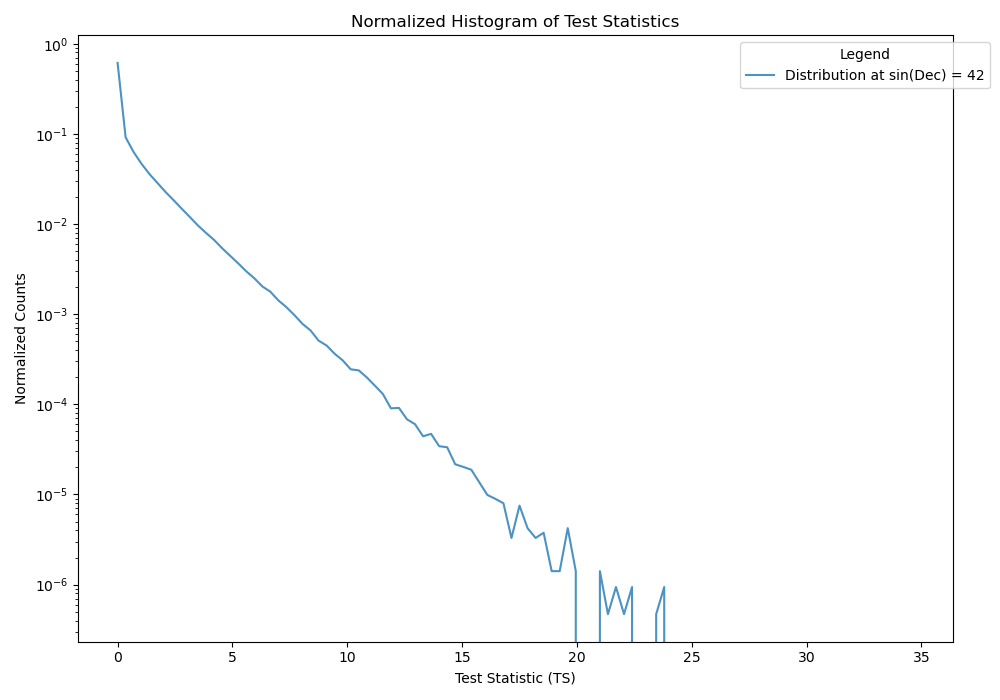

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Anti-Cumulative_Distribution_of_Normalized_Test_Statistics_for_sin(Dec)_=_42_bins_100.png


In [188]:
##~Working~##  P Normalised raw Dist.  ##
##~~~~~~~~~##==========================##

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2

# Plot the normalized histogram
fig_hist, ax_hist = plt.subplots(figsize=(10, 7))

for decl in declinations:
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        normalized_histogram = histogram_2d[idx, :] / total_counts
        ax_hist.plot(y_edges[:-1], normalized_histogram, label=f'Distribution at sin(Dec) = {decl}', alpha=0.8)

ax_hist.set_xlabel('Test Statistic (TS)')
ax_hist.set_ylabel('Normalized Counts')
ax_hist.set_title('Normalized Histogram of Test Statistics')
ax_hist.set_yscale('log')
ax_hist.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax_hist.grid(False)
plt.tight_layout()

# Show the normalized histogram
plt.show()

save_plot(fig3, ax3, datapick)


P-value for TS = 9: 2.8470e-03
P-value for TS = 16: 6.6963e-05
P-value for TS = 20: 6.8576e-06
P-value for TS = 25: 0.0000e+00


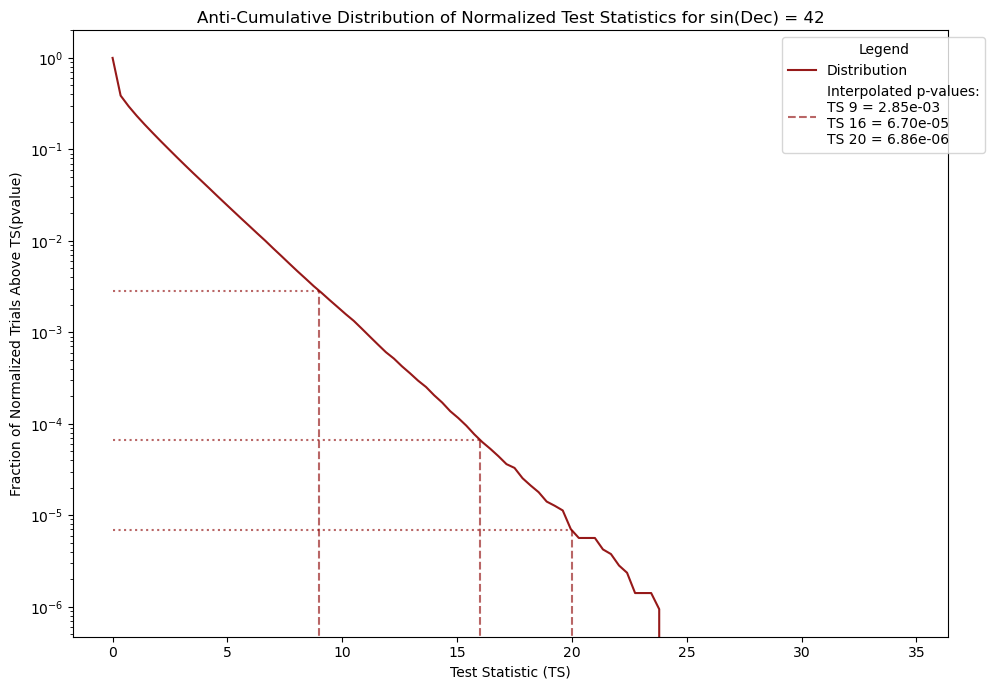

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Anti-Cumulative_Distribution_of_Normalized_Test_Statistics_for_sin(Dec)_=_42_bins_100.png
P-value for TS = 9: 2.8470e-03
P-value for TS = 16: 6.6963e-05
P-value for TS = 20: 6.8576e-06
P-value for TS = 25: 0.0000e+00


In [170]:
##~Working~##  P unfitted raw Dist.   ##
##~~~~~~~~~##=========================##

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']
raw_color = 'darkred'
cut_color = '#9400D3'
fit_color = 'darkblue'
def find_critical_p_value(cumulative_distribution, ts_value, y_edges):
    # Check if the TS value is within the range of y_edges
    if ts_value < y_edges[0] or ts_value > y_edges[-1]:
        raise ValueError("TS value is out of the range of y_edges.")

    # Find the index where the TS value would be inserted in y_edges to maintain order
    critical_index = np.searchsorted(y_edges, ts_value, side='left')

    # Edge cases: if ts_value is exactly on the boundaries of y_edges
    if critical_index == len(y_edges):
        return 0.0  # If TS is larger than the largest y_edge
    elif critical_index == 0:
        return 1.0  # If TS is smaller than the smallest y_edge

    # Get the cumulative distribution values at the surrounding indices
    y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
    p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]

    # Linear interpolation to find the p-value at the given TS value
    slope = (p1 - p0) / (y1 - y0)
    p_value = p0 + slope * (ts_value - y0)

    # Normalize the p-value by dividing by the total trials to get the fraction
    total_trials = cumulative_distribution[0]
    p_value = p_value / total_trials

    return p_value

# Define specific declination values (in degrees)
# Find the indices for the specified declinations

indices = [np.abs(x_edges - decl).argmin() for decl in declinations]

# Initialize a new plot for P-value distribution
fig3, ax3 = plt.subplots(figsize=(10, 7))

for decl in declinations:
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        total_trials_norm = cumulative_sum_norm_hist[0]
        fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm       
        mu_threshold = 0.5
        
        line, = ax3.plot(y_edges[:-1], fraction_above_ts_norm, color=raw_color, label=f'Distribution', alpha=0.9)
        
        x_data_plotted_p = line.get_xdata()
        y_data_plotted_p = line.get_ydata()
        
        valid_data_mask = y_data_plotted_p > 0
        x_data_valid = x_data_plotted_p[valid_data_mask]
        y_data_valid = y_data_plotted_p[valid_data_mask]     
        
        ts_values = [9, 16, 20, 25]
        frequentist_p_values = []
        
        for ts_value in ts_values:
            p_value = find_critical_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
            # Plot the vertical and horizontal dashed lines for the p-values
            ax3.plot([ts_value, ts_value], [0, p_value], color=raw_color, linestyle='--', alpha=0.6)
            ax3.plot([y_edges[0], ts_value], [p_value, p_value], color=raw_color, linestyle=':', alpha=0.6)
            print(f"P-value for TS = {ts_value}: {p_value:.4e}")
            
            # Append only non-zero p-values to the list
            if p_value > 0:
                frequentist_p_values.append((ts_value, p_value))

        # Format the p-values and add them to the legend
        if frequentist_p_values:  # Only add to legend if there are non-zero p-values
            p_values_formatted = '\n'.join([f'TS {ts} = {p:.2e}' for ts, p in frequentist_p_values])
            label_text = f'Interpolated p-values:\n{p_values_formatted}'
            ax3.plot([], [], color=raw_color, linestyle='--', alpha=0.6, label=label_text)

ax3.set_xlabel('Test Statistic (TS)')
ax3.set_ylabel('Fraction of Normalized Trials Above TS(pvalue)')
ax3.set_title(f'Anti-Cumulative Distribution of Normalized Test Statistics for sin(Dec) = {declinations_str}')
ax3.set_yscale('log')
ax3.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax3.grid(False)
plt.tight_layout()
plt.show()
save_plot(fig3, ax3, datapick)
for ts_value in ts_values:
    p_value = find_critical_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
    print(f"P-value for TS = {ts_value}: {p_value:.4e}")
    

mu cut at 0.5 TS
Frequentist P-value for TS = 9: 2.85e-03
Frequentist P-value for TS = 16: 6.70e-05
Frequentist P-value for TS = 20: 6.86e-06
Frequentist P-value for TS = 25: 0.00e+00
Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Anti-Cumulative_Distribution_with_μ_cut_at_0.5_for_sin(Dec)_=_42_bins_100.png


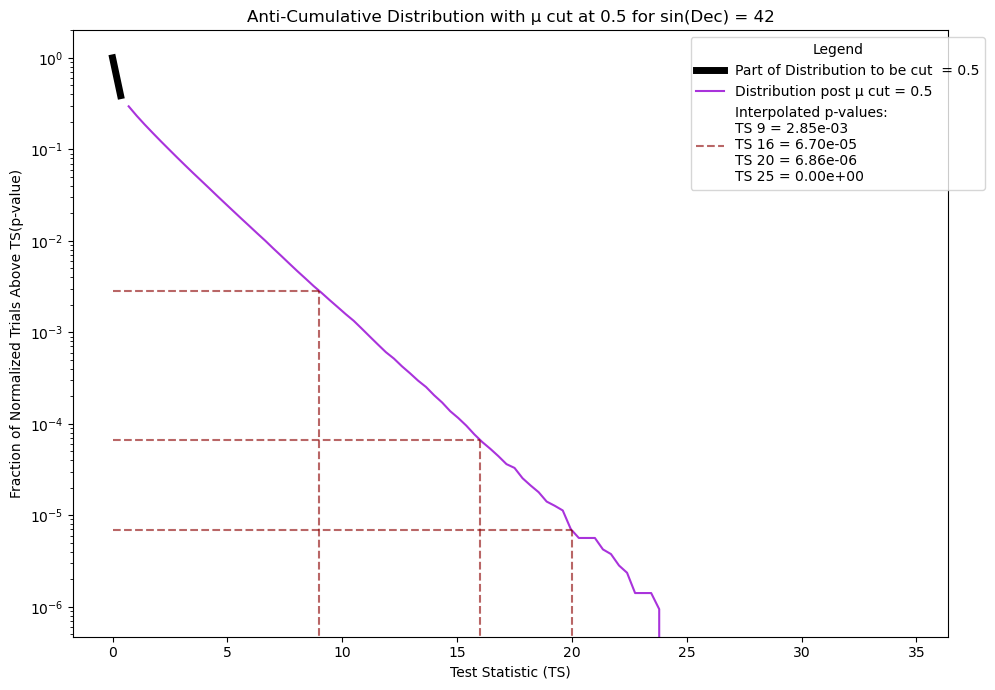

In [171]:
##~Working~##    P-value manual Single(dec) cut      ##
##~~~~~~~~~##========================================##
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Create a function to find the critical p-value for a given TS value
def find_critical_p_value(cumulative_distribution, ts_value, y_edges):
    if ts_value < y_edges[0] or ts_value > y_edges[-1]:
        raise ValueError("TS value is out of the range of y_edges.")

    critical_index = np.searchsorted(y_edges, ts_value, side='left')

    if critical_index == len(y_edges):
        return 0.0
    elif critical_index == 0:
        return 1.0

    y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
    p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]

    slope = (p1 - p0) / (y1 - y0)
    p_value = p0 + slope * (ts_value - y0)

    total_trials = cumulative_distribution[0]
    p_value = p_value / total_trials

    return p_value

# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)

# Initialize plot
fig, ax = plt.subplots(figsize=(10, 7))
mu = 0.5
print(f'mu cut at {mu} TS')

raw_color = 'darkred'
cut_color = '#9400D3'
fit_color = 'darkblue'

# Plot the p-value distributions and fit the chi-square model
for decl in declinations:
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        total_trials_norm = cumulative_sum_norm_hist[0]
        fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm       
    
        # Apply the mu filter to y_edges and fraction_above_ts_norm
        filtered_mask = y_edges[:-1] >= mu
        filtered_y_edges = y_edges[:-1][filtered_mask]
        filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]
        # Apply the mu filter to y_edges and show below cut
        filtered_mask_cut = y_edges[:-1] < mu
        filtered_y_edges_cut = y_edges[:-1][filtered_mask_cut]
        filtered_fraction_above_ts_norm_cut = fraction_above_ts_norm[filtered_mask_cut]
        # Plot the anti-cumulative distribution
        linecut, = ax.plot(filtered_y_edges_cut, filtered_fraction_above_ts_norm_cut, color='black', linestyle='-', alpha=1,linewidth=5, label=f'Part of Distribution to be cut  = {mu}')

        # Plot the anti-cumulative distribution after the mu filter
        line, = ax.plot(filtered_y_edges, filtered_fraction_above_ts_norm, color=cut_color, linestyle='-', alpha=0.8, label=f'Distribution post μ cut = {mu}')
        
        # Extract the data that was actually plotted
        x_data_plotted = line.get_xdata()
        y_data_plotted = line.get_ydata()
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask = y_data_plotted > 0
        x_data_valid = x_data_plotted[valid_data_mask]
        y_data_valid = y_data_plotted[valid_data_mask]

        # Fit the chi-squared model to the valid data
        popt, pcov = curve_fit(chi_squared_model, x_data_valid, y_data_valid, p0=[2.0], maxfev=10000)
        df = popt[0]
        df_err = np.sqrt(np.diag(pcov))[0]  # Uncertainty in the degree of freedom
        
        # Calculate the chi-squared fit using the valid data
        chi_squared_fit = chi_squared_model(x_data_valid, df)
        
        # Plot the chi-squared fit
        #ax.plot(x_data_valid, chi_squared_fit, color=fit_color, linestyle='--', label=f'\u03C7² fit (df={df:.2f}±{df_err:.2f})')

        # Calculate and plot p-values for specific TS values
            
        ts_values = [9, 16, 20, 25]
        frequentist_p_values = []
        for ts_value in ts_values:
            # Frequentist p-value
            frequentist_p_value = find_critical_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
            y_frequentist = np.interp(ts_value, filtered_y_edges, filtered_fraction_above_ts_norm)
            ax.plot([ts_value, ts_value], [0, y_frequentist], color=raw_color, linestyle='--', alpha=0.6)
            ax.plot([y_edges[0], ts_value], [y_frequentist, y_frequentist], color=raw_color, linestyle='--', alpha=0.6)
            print(f"Frequentist P-value for TS = {ts_value}: {frequentist_p_value:.2e}")
            frequentist_p_values.append(frequentist_p_value)
            # # Fitted p-value using chi-squared model
            # fitted_p_value = chi2.sf(ts_value, df)
            # y_fitted = np.interp(ts_value, x_data_valid, chi_squared_fit)
            # ax.plot([ts_value, ts_value], [0, y_fitted], color=fit_color, linestyle=':', alpha=0.8)
            # ax.plot([y_edges[0], ts_value], [y_fitted, y_fitted], color=fit_color, linestyle=':', alpha=0.8)
            # print(f"Fitted P-value for TS = {ts_value}: {fitted_p_value:.4e}")

            # # Ensure the printed p-values match the plotted lines
            # p_value_difference = y_frequentist - y_fitted
            # print(f"Difference between Frequentist and Fitted P-values for TS = {ts_value}: {p_value_difference:.4e}")
            # Format each p-value for the label
        p_values_formatted = '\n'.join([f'TS {ts} = {p:.2e}' for ts, p in zip(ts_values, frequentist_p_values)])
        label_text = f'Interpolated p-values:\n{p_values_formatted}'
        ax.plot([], [], color=raw_color, linestyle='--', alpha=0.6, label=label_text)
# Finalize the plot
ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS(p-value)')
ax.set_title(f'Anti-Cumulative Distribution with μ cut at {mu} for sin(Dec) = {declinations_str}')
ax.set_yscale('log')
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax.grid(False)
plt.tight_layout()
save_plot(fig, ax, datapick)
# Display the plot
plt.show()

mu cut at 1 TS


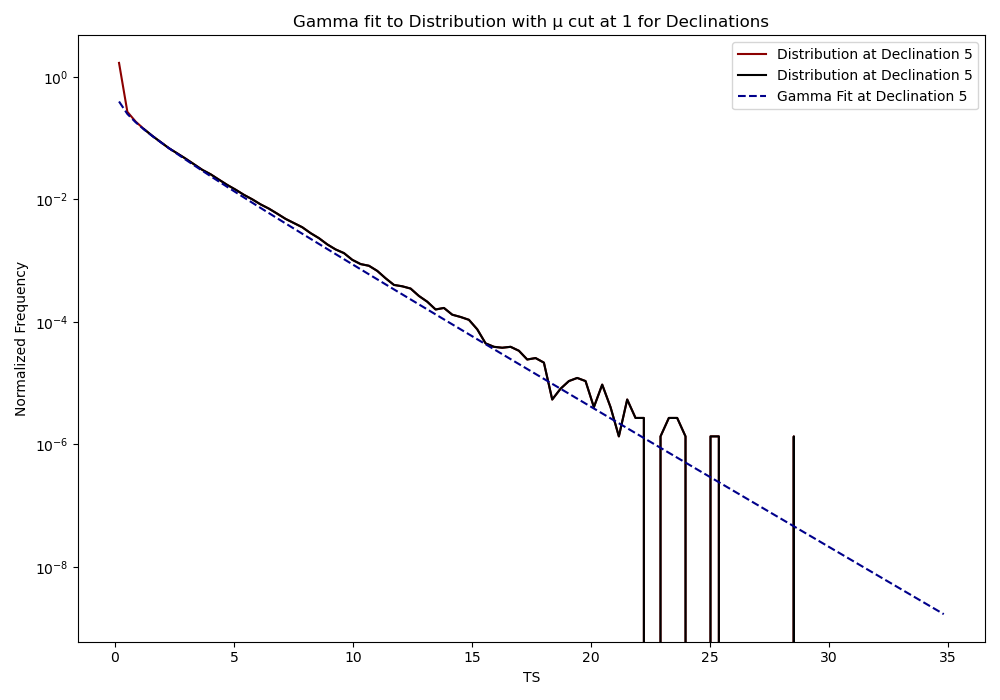

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import gamma as gamma_dist_scipy
import sys
import math

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Create a function to find the critical p-value for a given TS value
def find_critical_p_value(cumulative_distribution, ts_value, y_edges):
    if ts_value < y_edges[0] or ts_value > y_edges[-1]:
        raise ValueError("TS value is out of the range of y_edges.")

    critical_index = np.searchsorted(y_edges, ts_value, side='left')

    if critical_index == len(y_edges):
        return 0.0
    elif critical_index == 0:
        return 1.0

    y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
    p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]

    slope = (p1 - p0) / (y1 - y0)
    p_value = p0 + slope * (ts_value - y0)

    return p_value

mu = 1

# Gamma function
def gamma_func(x, a, b):
    return b**a * x ** (a - 1) * np.exp(-b * x) / math.gamma(a)

# Gamma fit function
def gamma_fit_func(x, xi, a, b):
    norm_int = gamma_dist_scipy.sf(mu, a, scale=1 / b)
    norm = xi / norm_int
    return norm * gamma_func(x, a, b)

# Initialize plot
fig, ax = plt.subplots(figsize=(10, 7))

print(f'mu cut at {mu} TS')

raw_color = 'darkred'
cut_color = '#9400D3'
fit_color = 'darkblue'

# Plot the p-value distributions and fit the gamma model
for decl in declinations:
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        bin_widths = np.diff(y_edges)
        normalized_histogram = histogram_2d[idx, :] / (total_counts * bin_widths)
        
        xcenters = (y_edges[:-1] + y_edges[1:]) / 2
        
        ax.plot(xcenters, normalized_histogram, color=raw_color, label=f'Distribution at Declination {decl}')
        
        # Apply the mu filter to y_edges and normalized histogram
        filtered_mask = xcenters >= mu
        filtered_y_edges = xcenters[filtered_mask]
        filtered_histogram = normalized_histogram[filtered_mask]
        ax.plot(filtered_y_edges, filtered_histogram, color='black', label=f'Distribution at Declination with cut {decl}')
        # Calculate the ratio for xi
        ratio_y = np.sum(histogram_2d[idx, :][filtered_mask]) / total_counts
        xi = ratio_y
        
        # Perform the curve fitting and extract the fit parameters
        try:
            popt, pcov = curve_fit(
                lambda x, a, b: gamma_fit_func(x, xi, a, b),
                filtered_y_edges,
                filtered_histogram,
                p0=[0.7, 0.5], 
                bounds=([0.5, 0.1], [1.0, 1.0]),
                maxfev=10000,
            )
        except RuntimeError as e:
            print(f"Error in curve fitting: {e}")
            continue
        
        # Calculate and plot the fit results
        fit_results = gamma_fit_func(xcenters, xi, *popt)
        ax.plot(xcenters, fit_results, color=fit_color, linestyle='--', label=f'Gamma Fit at Declination {decl}')
        
        ax.set_yscale('log')
        ax.set_xlabel("TS")
        ax.set_ylabel("Normalized Frequency")
        ax.legend()

# Finalize the plot
ax.set_title(f'Gamma fit to Distribution with μ cut at {mu} for Declinations')
plt.tight_layout()
plt.show()

In [1]:
##~Working~## P-value manual Single(dec) cut and fit.##
##~~~~~~~~~##========================================##
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
import scipy.optimize as sp
from scipy.stats import chi2
from scipy.stats import gamma
import math 
# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Create a function to find the critical p-value for a given TS value
def find_critical_p_value(cumulative_distribution, ts_value, y_edges):
    if ts_value < y_edges[0] or ts_value > y_edges[-1]:
        raise ValueError("TS value is out of the range of y_edges.")

    critical_index = np.searchsorted(y_edges, ts_value, side='left')

    if critical_index == len(y_edges):
        return 0.0
    elif critical_index == 0:
        return 1.0

    y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
    p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]

    slope = (p1 - p0) / (y1 - y0)
    p_value = p0 + slope * (ts_value - y0)

    total_trials = cumulative_distribution[0]
    p_value = p_value / total_trials

    return p_value
mu = 10

# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)
def gamma_func(x, a, b):
    return b**a * x ** (a - 1) * np.e ** (-b * x) / math.gamma(a)

def gamma_fit_func(x, xi, a, b):
    norm_int = gamma.sf(x=mu, a=a, loc=0, scale=1 / b)
    norm = xi / norm_int
    return norm * gamma_func(x, a, b)

# Initialize plot
fig, ax = plt.subplots(figsize=(10, 7))

print(f'mu cut at {mu} TS')

raw_color = 'darkred'
cut_color = '#9400D3'
fit_color = 'darkblue'

# Plot the p-value distributions and fit the chi-square model
for decl in declinations:
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        bin_widths = np.diff(y_edges)  # This gives you an array of bin widths
        normalized_histogram = histogram_2d[idx, :] / (total_counts*bin_widths)
        normalized_histogram = histogram_2d[idx, :] / (total_counts*bin_widths)
        xcenters = (y_edges[:-1] + y_edges[1:]) / 2
        
        ax.plot(xcenters, normalized_histogram)
        # cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        # total_trials_norm = cumulative_sum_norm_hist[0]
        # fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm       
        
        # Apply the mu filter to y_edges and fraction_above_ts_norm
        filtered_mask = xcenters >= mu
        filtered_y_edges = xcenters[filtered_mask]
        filtered_fraction_above_ts_norm = normalized_histogram[filtered_mask]


        ts_fit = filtered_fraction_above_ts_norm
        ratio_y = np.sum(histogram_2d[idx, :][filtered_mask]) / (total_counts)
        xi = ratio_y
        x_fit = filtered_y_edges
        
        
        # Plot the anti-cumulative distribution
        ax.plot(filtered_y_edges, filtered_fraction_above_ts_norm, color=raw_color, label=f'Distribution at  = {decl}', alpha=0.8)
        ax.set_yscale('log')
        
        # Plot the anti-cumulative distribution after the mu filter
        #line, = ax.plot(filtered_y_edges, filtered_fraction_above_ts_norm, color=cut_color, linestyle='-', alpha=0.8, label=f'Distribution with μ cut = {mu}')
        
        # Perform the curve fitting and extract the fit parameters
        popt, pcov = sp.curve_fit(
            lambda x, a, b: gamma_fit_func(x, xi, a, b),
            x_fit,
            ts_fit,
            p0=[0.7, 0.5], 
            bounds=([0.5, 0.1], [1.0, 1.0]),
            maxfev=10000,
        )
        # return popt, pcov, xi

        x_plot = xcenters
        fit_results = gamma_fit_func(
            x_plot, xi, *popt
        )  # Calculating the y values of the Gamma fit curve
        ax.plot(
            x_plot, fit_results, label=rf"TS $>$ {mu}", color="C0"
        )  # Plotting the Gamma fit curve
        ax.set_xlabel("TS")
        ax.set_ylabel("Frequency")
        ax.legend()
        plt.show()
        sys.exit()

        # # Calculate the chi-squared fit using the valid data
        
        # chi_squared_fit = chi_squared_model(x_data_valid, df)
        
        # # Plot the chi-squared fit
        # ax.plot(x_data_valid, chi_squared_fit, color=fit_color, linestyle='--', label=f'\u03C7² fit (df={df:.2f}±{df_err:.2f})')

        # # Calculate and plot p-values for specific TS values
        # ts_values = [9, 16, 20, 25]
        # for ts_value in ts_values:
        #     # Frequentist p-value
        #     frequentist_p_value = find_critical_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
        #     y_frequentist = np.interp(ts_value, filtered_y_edges, filtered_fraction_above_ts_norm)
        #     ax.plot([ts_value, ts_value], [0, y_frequentist], color=raw_color, linestyle='--', alpha=0.6)
        #     ax.plot([y_edges[0], ts_value], [y_frequentist, y_frequentist], color=raw_color, linestyle='--', alpha=0.6)
        #     print(f"Frequentist P-value for TS = {ts_value}: {frequentist_p_value:.4e}")

        #     # Fitted p-value using chi-squared model
        #     fitted_p_value = chi2.sf(ts_value, df)
        #     y_fitted = np.interp(ts_value, x_data_valid, chi_squared_fit)
        #     ax.plot([ts_value, ts_value], [0, y_fitted], color=fit_color, linestyle=':', alpha=0.8)
        #     ax.plot([y_edges[0], ts_value], [y_fitted, y_fitted], color=fit_color, linestyle=':', alpha=0.8)
        #     print(f"Fitted P-value for TS = {ts_value}: {fitted_p_value:.4e}")

        #     # Ensure the printed p-values match the plotted lines
        #     p_value_difference = y_frequentist - y_fitted
        #     print(f"Difference between Frequentist and Fitted P-values for TS = {ts_value}: {p_value_difference:.4e}")

# Finalize the plot
ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS(p-value)')
ax.set_title(f'\u03C7² fit to Anti-Cumulative Distribution with μ cut at {mu} for sin(Dec) = {declinations_str}')
ax.set_yscale('log')
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
ax.grid(False)
plt.tight_layout()
save_plot(fig, ax)
# Display the plot
plt.show()


NameError: name 'data' is not defined

In [31]:
np.sum(histogram_2d[idx, :])

np.float64(2124845.0)

In [32]:
normalized_histogram

array([1.75122017e+00, 2.61468484e-01, 1.79252066e-01, 1.32063414e-01,
       1.01564383e-01, 8.08072387e-02, 6.42722511e-02, 5.22175903e-02,
       4.20602108e-02, 3.40986216e-02, 2.75112504e-02, 2.27767874e-02,
       1.90629031e-02, 1.54175952e-02, 1.27041199e-02, 1.04720243e-02,
       8.55457356e-03, 7.16422005e-03, 5.81286097e-03, 5.07868977e-03,
       4.06483431e-03, 3.41806444e-03, 2.78877485e-03, 2.23075095e-03,
       1.88652416e-03, 1.45624067e-03, 1.28278264e-03, 1.04074818e-03,
       8.79391875e-04, 6.99210665e-04, 6.80385763e-04, 5.68780983e-04,
       4.61210112e-04, 3.72464143e-04, 2.58170092e-04, 2.60859364e-04,
       1.94972205e-04, 1.72113394e-04, 1.26395774e-04, 1.34463589e-04,
       9.81584203e-05, 9.54691485e-05, 6.18532511e-05, 5.78193435e-05,
       5.37854358e-05, 3.89944409e-05, 2.82373538e-05, 2.55480820e-05,
       2.28588102e-05, 9.41245126e-06, 2.15141743e-05, 1.21017231e-05,
       9.41245126e-06, 1.07570872e-05, 4.03390768e-06, 4.03390768e-06,
      

In [26]:
popt

array([0.5443566 , 0.41264359])

In [15]:
filtered_fraction_above_ts_norm

array([9.15139693e+00, 6.27382233e+00, 4.62221950e+00, 3.55475341e+00,
       2.82825335e+00, 2.24952879e+00, 1.82761566e+00, 1.47210738e+00,
       1.19345176e+00, 9.62893764e-01, 7.97187560e-01, 6.67201608e-01,
       5.39615831e-01, 4.44644198e-01, 3.66520852e-01, 2.99410075e-01,
       2.50747702e-01, 2.03450134e-01, 1.77754142e-01, 1.42269201e-01,
       1.19632256e-01, 9.76071196e-02, 7.80762832e-02, 6.60283456e-02,
       5.09684236e-02, 4.48973925e-02, 3.64261864e-02, 3.07787156e-02,
       2.44723733e-02, 2.38135017e-02, 1.99073344e-02, 1.61423539e-02,
       1.30362450e-02, 9.03595321e-03, 9.13007772e-03, 6.82402716e-03,
       6.02396881e-03, 4.42385209e-03, 4.70622563e-03, 3.43554471e-03,
       3.34142020e-03, 2.16486379e-03, 2.02367702e-03, 1.88249025e-03,
       1.36480543e-03, 9.88307382e-04, 8.94182870e-04, 8.00058357e-04,
       3.29435794e-04, 7.52996101e-04, 4.23560307e-04, 3.29435794e-04,
       3.76498050e-04, 1.41186769e-04, 1.41186769e-04, 4.23560307e-04,
      

In [33]:
xcenters

array([ 0.175,  0.525,  0.875,  1.225,  1.575,  1.925,  2.275,  2.625,
        2.975,  3.325,  3.675,  4.025,  4.375,  4.725,  5.075,  5.425,
        5.775,  6.125,  6.475,  6.825,  7.175,  7.525,  7.875,  8.225,
        8.575,  8.925,  9.275,  9.625,  9.975, 10.325, 10.675, 11.025,
       11.375, 11.725, 12.075, 12.425, 12.775, 13.125, 13.475, 13.825,
       14.175, 14.525, 14.875, 15.225, 15.575, 15.925, 16.275, 16.625,
       16.975, 17.325, 17.675, 18.025, 18.375, 18.725, 19.075, 19.425,
       19.775, 20.125, 20.475, 20.825, 21.175, 21.525, 21.875, 22.225,
       22.575, 22.925, 23.275, 23.625, 23.975, 24.325, 24.675, 25.025,
       25.375, 25.725, 26.075, 26.425, 26.775, 27.125, 27.475, 27.825,
       28.175, 28.525, 28.875, 29.225, 29.575, 29.925, 30.275, 30.625,
       30.975, 31.325, 31.675, 32.025, 32.375, 32.725, 33.075, 33.425,
       33.775, 34.125, 34.475, 34.825])

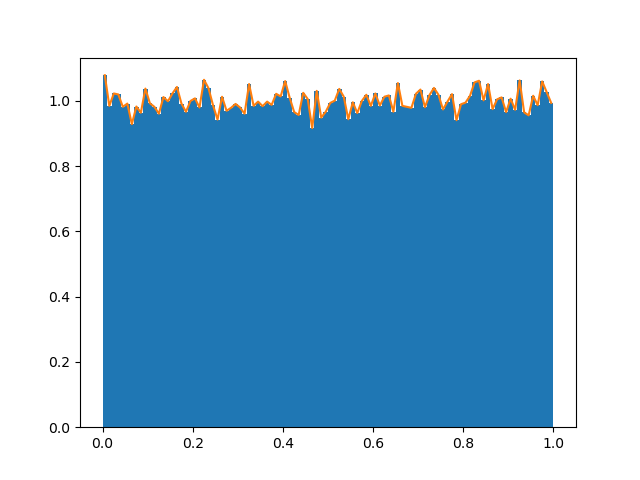

In [14]:
a = np.random.rand(100000)

fig, ax = plt.subplots()
ax.hist(a, bins=100, density=True)
ts_whole, edges = np.histogram(a, bins=100, density=False)
xcenters = (edges[:-1] + edges[1:]) / 2
ax.plot(xcenters, (ts_whole/len(a))*100)
plt.show()

Optimal μ found: 1.9721
Objective value: 0.0006
Sum of squared residuals for Decl = 42: 0.0018
Frequentist P-value for TS = 9: 2.6333e-03
Fitted P-value for TS = 9: 2.0693e-03
Difference between Frequentist and Fitted P-values for TS = 9: 5.6395e-04
Frequentist P-value for TS = 16: 3.7677e-05
Fitted P-value for TS = 16: 4.6864e-05
Difference between Frequentist and Fitted P-values for TS = 16: -9.1883e-06
Frequentist P-value for TS = 20: 4.7096e-06
Fitted P-value for TS = 20: 5.6489e-06
Difference between Frequentist and Fitted P-values for TS = 20: -9.3954e-07
Frequentist P-value for TS = 25: 0.0000e+00
Fitted P-value for TS = 25: 4.1221e-07
Difference between Frequentist and Fitted P-values for TS = 25: -2.7287e-06
Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/(Bayesian_Method)_Minimizing_p-value_Differences_at_a_declination_42_with_optimised_mu_cut_=_1.97_bins_1000.png


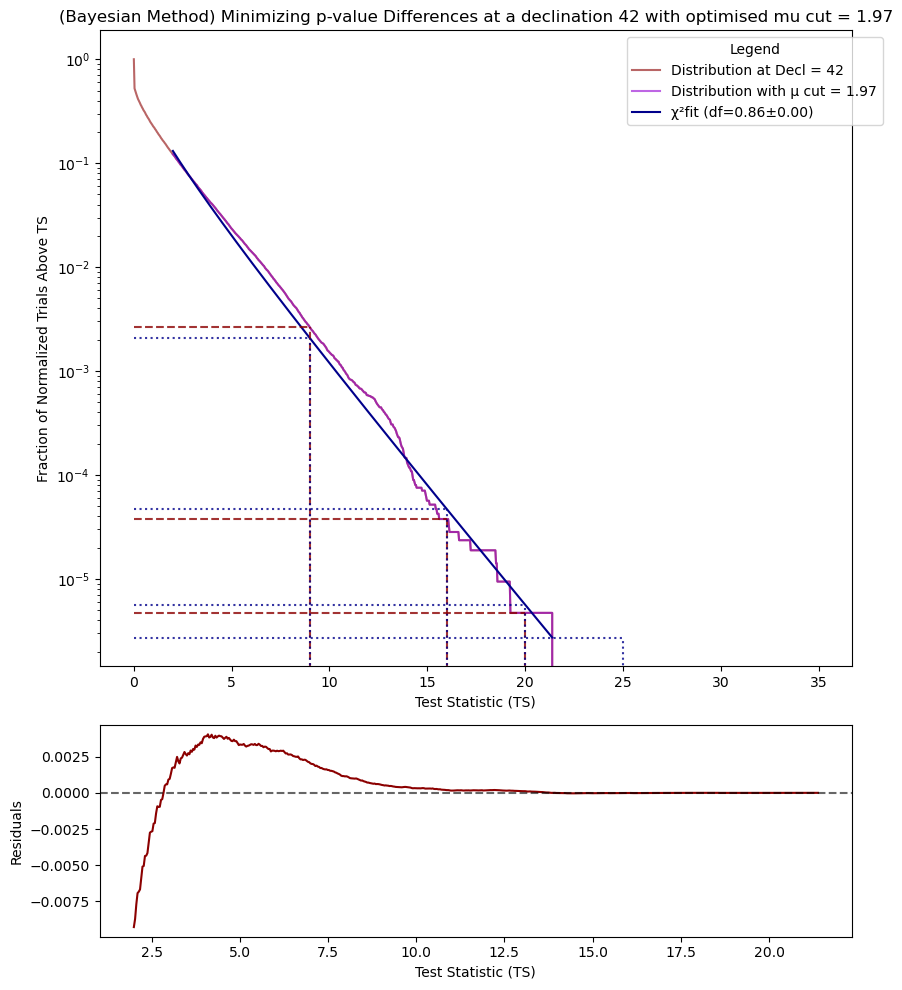

In [143]:
##~Working~## Bayesian Approach # Optimizing μ for p-value Differences
##~~~~~~~~~##=======================##

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2
from skopt import gp_minimize
from skopt.space import Real
from skopt.utils import use_named_args

# Access the individual arrays (assuming these are provided in `data`)
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Function to find the p-value for a given TS value
def find_p_value(cumulative_distribution, ts_value, y_edges):
    if ts_value < y_edges[0] or ts_value > y_edges[-1]:
        return 1.0 if ts_value < y_edges[0] else 0.0

    critical_index = np.searchsorted(y_edges, ts_value, side='left')

    if critical_index == len(y_edges):
        return 0.0
    elif critical_index == 0:
        return 1.0

    y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
    p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]

    slope = (p1 - p0) / (y1 - y0)
    p_value = p0 + slope * (ts_value - y0)

    return p_value / cumulative_distribution[0]

# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.sf(k, df)



raw_color = 'darkred'
cut_color = '#9400D3'
fit_color = 'darkblue'
# Define the search space for μ
search_space = [Real(0.01, 2.0, name='mu')]

# Define the objective function to minimize
@use_named_args(search_space)
def objective(mu):
    total_difference = 0
    
    for decl in declinations:
        idx = np.abs(x_edges - decl).argmin()
        total_counts = np.sum(histogram_2d[idx, :])
        
        if total_counts > 0:
            normalized_histogram = histogram_2d[idx, :] / total_counts
            cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
            fraction_above_ts_norm = cumulative_sum_norm_hist / cumulative_sum_norm_hist[0]       
            # Post cut renomralise and then fit fit
            # Apply the mu filter to y_edges and fraction_above_ts_norm
            filtered_mask = y_edges[:-1] >= mu
            filtered_y_edges = y_edges[:-1][filtered_mask]
            filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

            # If no data remains after filtering, skip this iteration
            if len(filtered_y_edges) == 0 or len(filtered_fraction_above_ts_norm) == 0:
                continue
            
            # Fit the chi-squared model to the valid data
            try:
                popt, _ = curve_fit(chi_squared_model, filtered_y_edges, filtered_fraction_above_ts_norm, p0=[2.0], maxfev=10000)
                df = popt[0]
            except (RuntimeError, ValueError):
                continue  # Skip if fitting fails
            
            # Calculate the p-value differences for specific TS values
            ts_values = [9, 16, 20, 25]
            for ts_value in ts_values:
                # Calculate frequentist p-value
                p_value_frequentist = find_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
                
                # Calculate fitted p-value using chi-squared model
                p_value_fitted = chi_squared_model(ts_value, df)
                
                # Sum of absolute differences
                total_difference += abs(p_value_frequentist - p_value_fitted)
    
    return total_difference

# Run Bayesian Optimization
from skopt import forest_minimize

res = forest_minimize(
    objective, 
    search_space, 
    n_calls=50, 
    random_state=42
)

# Output the results
print(f"Optimal μ found: {res.x[0]:.4f}")
print(f"Objective value: {res.fun:.4f}")

# Use the optimized μ in your analysis
optimal_mu = res.x[0]

# Now use the optimal μ value to plot the results as before

# Initialize plot with two subplots: one for the fit and one for the residuals
fig, (ax, ax_res) = plt.subplots(2, 1, figsize=(9, 10), gridspec_kw={'height_ratios': [3, 1]})

# Plot the anti-cumulative distributions and fit the chi-squared model
for decl in declinations: 
    # Find index and plot
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        fraction_above_ts_norm = cumulative_sum_norm_hist / cumulative_sum_norm_hist[0]       

        # Apply the mu filter to y_edges and fraction_above_ts_norm
        filtered_mask = y_edges[:-1] >= optimal_mu
        filtered_y_edges = y_edges[:-1][filtered_mask]
        filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]
        line, = ax.plot(y_edges[:-1], fraction_above_ts_norm, color=raw_color, label=f'Distribution at Decl = {decl}', alpha=0.6)

        # Plot the anti-cumulative distribution and store the line object
        line, = ax.plot(filtered_y_edges, filtered_fraction_above_ts_norm, color=cut_color, label=f'Distribution with μ cut = {optimal_mu:.2f}', alpha=0.6)
        
        # Extract the data that was actually plotted
        x_data_plotted = line.get_xdata()
        y_data_plotted = line.get_ydata()
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask = y_data_plotted > 0
        x_data_valid = x_data_plotted[valid_data_mask]
        y_data_valid = y_data_plotted[valid_data_mask]
        
        # Fit the chi-squared model to the valid data
        popt, pcov = curve_fit(chi_squared_model, x_data_valid, y_data_valid, p0=[2.0], maxfev=10000)
        df = popt[0]
        df_err = np.sqrt(np.diag(pcov))[0]  # Uncertainty in the degree of freedom
        
        # Calculate the chi-squared fit using the valid data
        chi_squared_fit = chi_squared_model(x_data_valid, df)
        
        # Plot the chi-squared fit
        ax.plot(x_data_valid, chi_squared_fit, color=fit_color, linestyle='-', label=f'\u03C7²fit (df={df:.2f}±{df_err:.2f})')
        
        # Calculate residuals and plot them
        residuals = y_data_valid - chi_squared_fit
        ax_res.plot(x_data_valid, residuals, color=raw_color, linestyle='-', label=f'Residuals (Decl = {decl})')
        
        # Calculate and print the sum of squared residuals
        sum_squared_residuals = np.sum(residuals**2)
        print(f'Sum of squared residuals for Decl = {decl}: {sum_squared_residuals:.4f}')
        
        # Calculate and plot p-values for specific TS values
        ts_values = [9, 16, 20, 25]
        for ts_value in ts_values:
            # Frequentist p-value
            frequentist_p_value = find_critical_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
            y_frequentist = np.interp(ts_value, filtered_y_edges, filtered_fraction_above_ts_norm)
            ax.plot([ts_value, ts_value], [0, y_frequentist], color=raw_color, linestyle='--', alpha=0.8)
            ax.plot([y_edges[0], ts_value], [y_frequentist, y_frequentist], color=raw_color, linestyle='--', alpha=0.8)
            print(f"Frequentist P-value for TS = {ts_value}: {frequentist_p_value:.4e}")

            # Fitted p-value using chi-squared model
            fitted_p_value = chi2.sf(ts_value, df)
            y_fitted = np.interp(ts_value, x_data_valid, chi_squared_fit)
            ax.plot([ts_value, ts_value], [0, y_fitted], color=fit_color, linestyle=':', alpha=0.8)
            ax.plot([y_edges[0], ts_value], [y_fitted, y_fitted], color=fit_color, linestyle=':', alpha=0.8)
            print(f"Fitted P-value for TS = {ts_value}: {fitted_p_value:.4e}")

            # Ensure the printed p-values match the plotted lines
            p_value_difference = y_frequentist - y_fitted
            print(f"Difference between Frequentist and Fitted P-values for TS = {ts_value}: {p_value_difference:.4e}")

# Finalize the plot
ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS')
ax.set_title(f'(Bayesian Method) Minimizing p-value Differences at a declination {declinations_str} with optimised mu cut = {optimal_mu:.2f}')
ax.grid(False)
ax.set_yscale('log')

# Residuals plot
ax_res.set_xlabel('Test Statistic (TS)')
ax_res.set_ylabel('Residuals')
ax_res.axhline(0, color='black', linestyle='--', alpha=0.6)
ax_res.grid(False)
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
plt.tight_layout()
save_plot(fig, ax, datapick)
# Display the plot
plt.show()



Optimized μ: 1.9727
Sum of squared residuals for Decl = 42: 0.0001
Frequentist P-value for TS = 9: 2.8470e-03
Fitted P-value for TS = 9: 4.7323e-03
Difference between Frequentist and Fitted P-values for TS = 9: 3.2489e-04
Frequentist P-value for TS = 16: 6.6963e-05
Fitted P-value for TS = 16: 1.2107e-04
Difference between Frequentist and Fitted P-values for TS = 16: 3.9648e-06
Frequentist P-value for TS = 20: 6.8576e-06
Fitted P-value for TS = 20: 1.5325e-05
Difference between Frequentist and Fitted P-values for TS = 20: -1.0517e-06
Frequentist P-value for TS = 25: 0.0000e+00
Fitted P-value for TS = 25: 1.1753e-06
Difference between Frequentist and Fitted P-values for TS = 25: -1.1150e-06


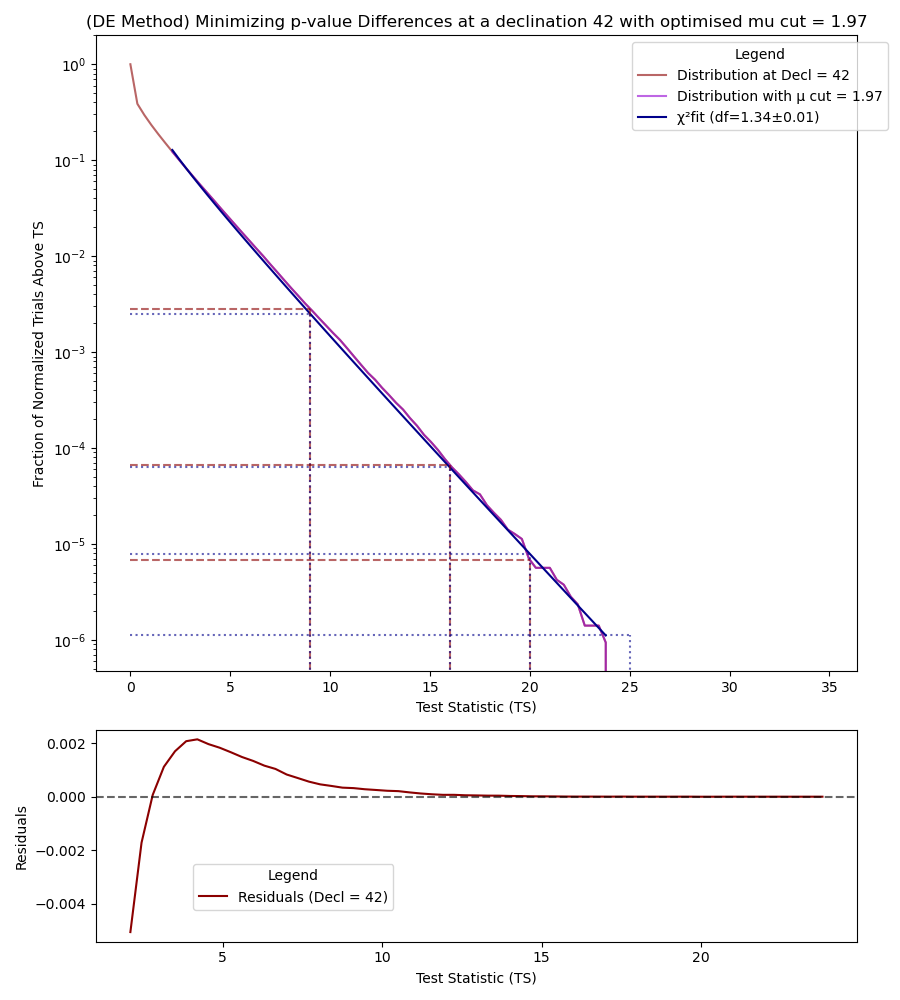

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/(DE_Method)_Minimizing_p-value_Differences_at_a_declination_42_with_optimised_mu_cut_=_1.97.png


In [11]:
##~Working~##~Differential Approach~##~Optimizing μ for p-value Differences~##
##~~~~~~~~~##=======================##=====================================~##


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit, differential_evolution
from scipy.stats import chi2
# Access the individual arrays (assuming these are provided in `data`)
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Function to find the p-value for a given TS value
def find_p_value(cumulative_distribution, ts_value, y_edges):
    if ts_value < y_edges[0] or ts_value > y_edges[-1]:
        return 1.0 if ts_value < y_edges[0] else 0.0

    critical_index = np.searchsorted(y_edges, ts_value, side='left')

    if critical_index == len(y_edges):
        return 0.0
    elif critical_index == 0:
        return 1.0

    y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
    p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]

    slope = (p1 - p0) / (y1 - y0)
    p_value = p0 + slope * (ts_value - y0)

    return p_value / cumulative_distribution[0]

# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)
# def chi_squared_model(k, df):
#     return chi2.sf(k, df)  # Survival function
# def chi_squared_model(k, df):
#     return chi2.cdf(k, df)  # Cumulative distribution function
ts_values = [9, 16, 20, 25]
# Function to compute the distance between empirical and chi-squared p-values for a given mu
def compute_distance(mu, histogram_2d, x_edges, y_edges, declinations):
    distances = []
    mu = mu[0]  # Extract scalar value if mu is passed as an array
    
    for decl in declinations:
        idx = np.abs(x_edges - decl).argmin()
        total_counts = np.sum(histogram_2d[idx, :])
        
        if total_counts > 0:
            normalized_histogram = histogram_2d[idx, :] / total_counts
            cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
            fraction_above_ts_norm = cumulative_sum_norm_hist / cumulative_sum_norm_hist[0]       
            
            # Apply the mu filter to y_edges and fraction_above_ts_norm
            filtered_mask = y_edges[:-1] >= mu
            filtered_y_edges = y_edges[:-1][filtered_mask]
            filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

            # If no data remains after filtering, skip this iteration
            if len(filtered_y_edges) == 0 or len(filtered_fraction_above_ts_norm) == 0:
                continue
            
            # Fit the chi-squared model to the valid data
            try:
                popt, _ = curve_fit(chi_squared_model, filtered_y_edges, filtered_fraction_above_ts_norm, p0=[2.0], maxfev=10000)
                df = popt[0]
            except (RuntimeError, ValueError):
                continue  # Skip if fitting fails
            
            # Calculate the p-values for specific TS values

            for ts_value in ts_values:
                # Calculate frequentist p-value
                p_value_frequentist = find_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
                
                # Calculate fitted p-value using chi-squared model
                p_value_fitted = chi_squared_model(ts_value, df)
                
                # Sum of absolute differences
                distance = abs(p_value_frequentist - p_value_fitted)
                distances.append(distance)
    
    # Compute the sum of distances
    total_distance = np.sum(distances)
    
    return total_distance

# Initial guess for mu
initial_mu = 0.62

# Run the minimization using differential evolution
result = differential_evolution(compute_distance, bounds=[(0, 2)], args=(histogram_2d, x_edges, y_edges, declinations))

# Extract the optimized mu value
optimized_mu = result.x[0]
print(f'Optimized μ: {optimized_mu:.4f}')

# Initialize plot with two subplots: one for the fit and one for the residuals
fig, (ax, ax_res) = plt.subplots(2, 1, figsize=(9, 10), gridspec_kw={'height_ratios': [3, 1]})

# Plot the anti-cumulative distributions and fit the chi-squared model
for decl in declinations:
      # Find index and plot
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        fitted_color= fit_color
        frequentest_color = raw_color
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        fraction_above_ts_norm = cumulative_sum_norm_hist / cumulative_sum_norm_hist[0]       
        empirical_p_values = [find_p_value(cumulative_sum_norm_hist, ts, y_edges[:-1]) for ts in ts_values ]
        line, = ax.plot(y_edges[:-1], fraction_above_ts_norm, color=raw_color, label=f'Distribution at Decl = {decl}', alpha=0.6)

        # Apply the mu filter to y_edges and fraction_above_ts_norm
        filtered_mask = y_edges[:-1] >= optimized_mu
        filtered_y_edges = y_edges[:-1][filtered_mask]
        filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]
        
        # Plot the anti-cumulative distribution and store the line object
        line, = ax.plot(filtered_y_edges, filtered_fraction_above_ts_norm, color=cut_color,label=f'Distribution with μ cut = {optimal_mu:.2f}', alpha=0.6)
        
        # Extract the data that was actually plotted
        x_data_plotted = line.get_xdata()
        y_data_plotted = line.get_ydata()
        
        # Filter out any data that wasn't plotted (e.g., NaNs, zeros)
        valid_data_mask = y_data_plotted > 0
        x_data_valid = x_data_plotted[valid_data_mask]
        y_data_valid = y_data_plotted[valid_data_mask]
        
        # Fit the chi-squared model to the valid data
        popt, pcov = curve_fit(chi_squared_model, x_data_valid, y_data_valid, p0=[2.0], maxfev=10000)
        df = popt[0]
        df_err = np.sqrt(np.diag(pcov))[0]  # Uncertainty in the degree of freedom
        
        # Calculate the chi-squared fit using the valid data
        chi_squared_fit = chi_squared_model(x_data_valid, df)
        
        # Plot the chi-squared fit
        ax.plot(x_data_valid, chi_squared_fit, color=fitted_color, linestyle='-', label=f'\u03C7²fit (df={df:.2f}±{df_err:.2f})')
        
        # Calculate residuals and plot them
        residuals = y_data_valid - chi_squared_fit
        ax_res.plot(x_data_valid, residuals, color=raw_color, linestyle='-', label=f'Residuals (Decl = {decl})')
        
        # Calculate and print the sum of squared residuals
        sum_squared_residuals = np.sum(residuals**2)
        print(f'Sum of squared residuals for Decl = {decl}: {sum_squared_residuals:.4f}')
        
        # Calculate and plot p-values for specific TS values
        for ts_value in ts_values:
            # Frequentist p-value
            frequentist_p_value = find_critical_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
            y_frequentist = np.interp(ts_value, filtered_y_edges, filtered_fraction_above_ts_norm)
            ax.plot([ts_value, ts_value], [0, y_frequentist], color=frequentest_color, linestyle='--', alpha=0.6)
            ax.plot([y_edges[0], ts_value], [y_frequentist, y_frequentist], color=frequentest_color, linestyle='--', alpha=0.6)
            print(f"Frequentist P-value for TS = {ts_value}: {frequentist_p_value:.4e}")

            # Fitted p-value using chi-squared model
            fitted_p_value = chi2.sf(ts_value, df)
            y_fitted = np.interp(ts_value, x_data_valid, chi_squared_fit)
            ax.plot([ts_value, ts_value], [0, y_fitted], color=fitted_color, linestyle=':', alpha=0.6)
            ax.plot([y_edges[0], ts_value], [y_fitted, y_fitted], color=fitted_color, linestyle=':', alpha=0.6)
            print(f"Fitted P-value for TS = {ts_value}: {fitted_p_value:.4e}")

            # Ensure the printed p-values match the plotted lines
            p_value_difference = y_frequentist - y_fitted
            print(f"Difference between Frequentist and Fitted P-values for TS = {ts_value}: {p_value_difference:.4e}")

# Finalize the plot
ax.set_xlabel('Test Statistic (TS)')
ax.set_ylabel('Fraction of Normalized Trials Above TS')
ax.set_title(f'(DE Method) Minimizing p-value Differences at a declination {declinations_str} with optimised mu cut = {optimal_mu:.2f}')
ax.grid(False)
ax.set_yscale('log')
ax.legend(loc='best', bbox_to_anchor=(1.05, 1), title='Legend')
# Residuals plot
ax_res.set_xlabel('Test Statistic (TS)')
ax_res.set_ylabel('Residuals')
ax_res.axhline(0, color='black', linestyle='--', alpha=0.6)
ax_res.grid(False)
ax_res.legend(loc='best', bbox_to_anchor=(0.4 ,0.4), title='Legend')
plt.tight_layout()
plt.show()
save_plot(fig, ax, datapick)



In [205]:
# #~Testing~# p value Differential method all Dec #
# #~~~~~~~~~#=============================#
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.optimize import differential_evolution, curve_fit
# from scipy.stats import chi2
# import time
# import json
# import cProfile
# import pstats
# from pstats import SortKey

# # Function to find the p-value for a given TS value
# def find_p_value(cumulative_distribution, ts_value, y_edges):
#     if ts_value < y_edges[0] or ts_value > y_edges[-1]:
#         return 1.0 if ts_value < y_edges[0] else 0.0

#     critical_index = np.searchsorted(y_edges, ts_value, side='left')

#     if critical_index == len(y_edges):
#         return 0.0
#     elif critical_index == 0:
#         return 1.0

#     y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
#     p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]

#     slope = (p1 - p0) / (y1 - y0)
#     p_value = p0 + slope * (ts_value - y0)

#     return p_value / cumulative_distribution[0]

# # Chi-squared model function
# def chi_squared_model(k, df):
#     return chi2.pdf(k, df)

# def compute_distance(mu, histogram_2d, x_edges, y_edges, declinations):
#     distances = []
#     mu = mu[0]  # Extract scalar value if mu is passed as an array
    
#     for decl in declinations:
#         # Ensure decl is within the range of x_edges
#         if decl < x_edges[0] or decl > x_edges[-1]:
#             continue
        
#         idx = np.abs(x_edges - decl).argmin()
        
#         # Boundary check
#         if idx < 0 or idx >= histogram_2d.shape[0]:
#             continue
        
#         total_counts = np.sum(histogram_2d[idx, :])
        
#         if total_counts > 0:
#             normalized_histogram = histogram_2d[idx, :] / total_counts
#             cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
#             fraction_above_ts_norm = cumulative_sum_norm_hist / cumulative_sum_norm_hist[0]       
            
#             # Apply the mu filter to y_edges and fraction_above_ts_norm
#             filtered_mask = y_edges[:-1] >= mu
#             filtered_y_edges = y_edges[:-1][filtered_mask]
#             filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

#             # If no data remains after filtering, skip this iteration
#             if len(filtered_y_edges) == 0 or len(filtered_fraction_above_ts_norm) == 0:
#                 continue
            
#             # Fit the chi-squared model to the valid data
#             try:
#                 popt, _ = curve_fit(chi_squared_model, filtered_y_edges, filtered_fraction_above_ts_norm, p0=[2.0], maxfev=10000)
#                 df = popt[0]
#             except (RuntimeError, ValueError):
#                 continue  # Skip if fitting fails
            
#             # Calculate the p-values for specific TS values
#             ts_values = [9, 16, 20, 25]
#             for ts_value in ts_values:
#                 # Calculate frequentist p-value
#                 p_value_frequentist = find_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
                
#                 # Calculate fitted p-value using chi-squared model
#                 p_value_fitted = chi_squared_model(ts_value, df)
                
#                 # Sum of absolute differences
#                 distance = abs(p_value_frequentist - p_value_fitted)
#                 distances.append(distance)
    
#     # Compute the sum of distances
#     total_distance = np.sum(distances)
    
#     return total_distance

# def main():
#     histogram_2d = np.array(data['histogram_2d'])
#     x_edges = np.array(data['x_edges'])
#     y_edges = np.array(data['y_edges'])
    
#     total_time = 0
#     # Calculate the number of bins
#     num_x_bins = len(x_edges) - 1
#     num_y_bins = len(y_edges) - 1
    
#     # Print the number of bins
#     print("Number of bins along the x-axis:", num_x_bins)
#     print("Number of bins along the y-axis:", num_y_bins)
    
#     # Convert declination edges to sine of declination
#     sin_x_edges = np.sin(np.radians(x_edges))
    
#     # Arrays to store results
#     optimized_mu_values = []
#     sin_x_midpoints = []

#     # Iterate over all declinations and optimize mu
#     for idx in range(len(x_edges) - 1):
#         start_time = time.time()
        
#         decl = (x_edges[idx] + x_edges[idx + 1]) / 2
#         sin_decl = np.sin(np.radians(decl))
        
#         print(f"\rProcessing declination bin {idx + 1}/{len(x_edges) - 1} (Declination: {decl:.2f}°)", end='')
        
#         # Optimization using differential evolution
#         result = differential_evolution(compute_distance, bounds=[(0, 2)], args=(histogram_2d, x_edges, y_edges, declinations))
        
#         # Store the results
#         optimized_mu_values.append(result.x[0])
#         sin_x_midpoints.append(sin_decl)
        
#         end_time = time.time()
#         elapsed_time = end_time - start_time
#         total_time += elapsed_time  # Update total time
        
#         print(f"\rProcessing declination bin {idx + 1}/{len(x_edges) - 1} (Declination: {decl:.2f}°) - Optimized μ: {result.x[0]:.4f} - Time taken: {elapsed_time:.2f} seconds - Total time: {total_time:.2f} seconds", end='')
    
#     # Save to a file
#     with open('optimized_mu_values_3sigma.json', 'w') as f:
#         json.dump({
#             'sin_x_midpoints': sin_x_midpoints,
#             'optimized_mu_values': optimized_mu_values
#         }, f)
#     print()

#     # Plot mu vs sin(declination)
#     plt.figure(figsize=(11, 6))
#     plt.plot(sin_x_midpoints, optimized_mu_values, color='blue', label='Optimized μ', linewidth=1.5, alpha=0.7)

#     # Mark the -5° and -10° declinations as in the example
#     plt.axvline(x=np.sin(np.radians(-5)), color='grey', linestyle='--', linewidth=.5, label='-5° Horizon')
#     plt.axvline(x=np.sin(np.radians(-10)), color='green', linestyle='--', linewidth=.5, label='-10°')
#     plt.axvline(x=np.sin(np.radians(10)), color='black', linestyle='--', linewidth=.5, label='+10°')

#     plt.xlabel('sin(Declination)')
#     plt.ylabel('Optimized μ Value')
#     plt.title('Optimized μ Value vs sin(Declination)')
#     plt.grid(False)
#     plt.legend()
#     plt.tight_layout()

#     # Save and show the plot
#     plt.savefig('optimized_mu_vs_sin_declination_3sigma.png')
#     plt.show()

# if __name__ == "__main__":
#     profiler = cProfile.Profile()
#     profiler.enable()
    
#     main()  # Run the main function which includes your code
    
#     profiler.disable()
    
#     # Output the profiling results
#     stats = pstats.Stats(profiler).sort_stats(SortKey.TIME)
#     stats.print_stats(10)  # Print the top 10 time-consuming functions

#     # Optionally, you can save the profile results to a file
#     # stats.dump_stats("profile_results_3sigma.prof")


Number of bins along the x-axis: 1000
Number of bins along the y-axis: 1000
Processing declination bin 325/1000 (Declination: -28.43°) - Optimized μ: 1.9645 - Time taken: 0.49 seconds - Total time: 165.65 seconds

KeyboardInterrupt: 

Number of bins along the x-axis: 100
Number of bins along the y-axis: 100
Processing declination bin 100/100 (Declination: 80.19°) - Optimized μ: 0.4007 - Time taken: 0.27 seconds - Total time: 21.59 seconds


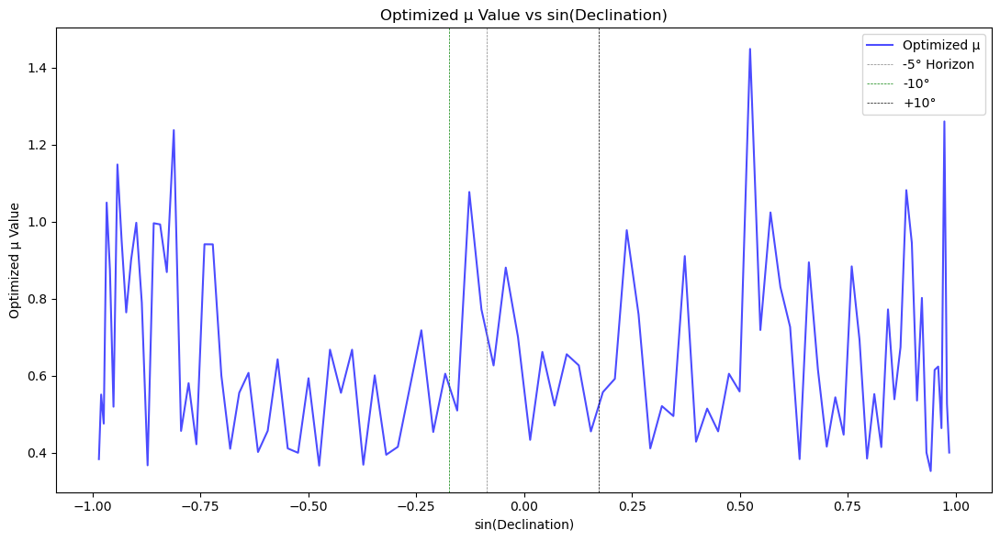

         19350339 function calls (19333705 primitive calls) in 22.124 seconds

   Ordered by: internal time
   List reduced from 1708 to 10 due to restriction <10>

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
   139544    3.602    0.000   16.596    0.000 /home/kennedyc/miniforge3/envs/jupenv/lib/python3.10/site-packages/scipy/stats/_distn_infrastructure.py:2002(pdf)
   586568    2.824    0.000    3.744    0.000 /home/kennedyc/miniforge3/envs/jupenv/lib/python3.10/site-packages/numpy/lib/_stride_tricks_impl.py:349(_broadcast_to)
   139522    1.974    0.000    1.974    0.000 /home/kennedyc/miniforge3/envs/jupenv/lib/python3.10/site-packages/scipy/stats/_continuous_distns.py:1610(_logpdf)
   411435    0.951    0.000    0.951    0.000 {method 'reduce' of 'numpy.ufunc' objects}
   139544    0.764    0.000    1.279    0.000 /home/kennedyc/miniforge3/envs/jupenv/lib/python3.10/site-packages/scipy/stats/_distn_infrastructure.py:1016(_support_mask)
   148882    0.708

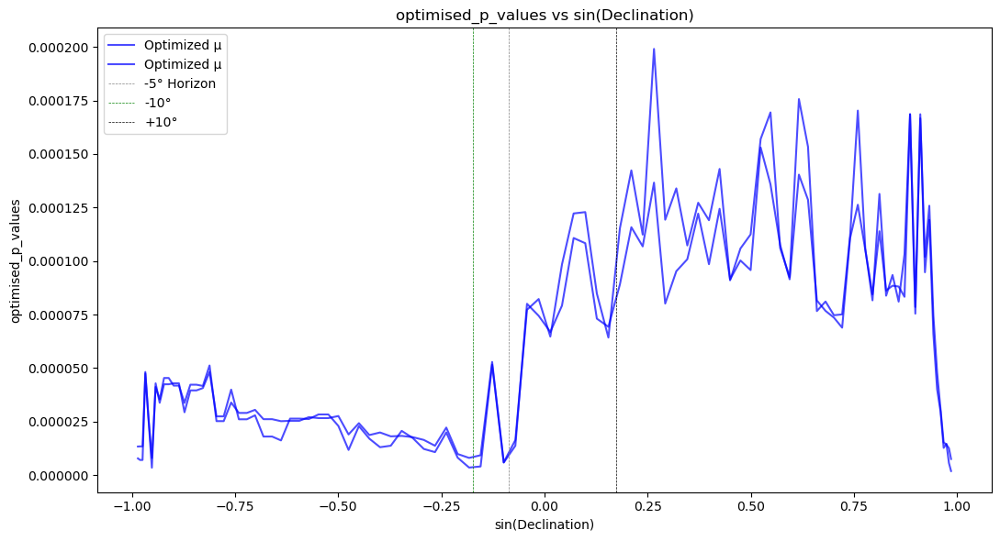

In [73]:
#~Working~# Differential method all Dec p-value # Mu cutter 1.0
#~~~~~~~~~#=====================================#

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import differential_evolution, curve_fit
from scipy.stats import chi2
import time
import json
import cProfile
import pstats
from pstats import SortKey

# Function to find the p-value for a given TS value
def find_p_value(ts_value, cumulative_distribution, y_edges):
    critical_index = np.searchsorted(y_edges[:-1], ts_value, side='right') - 1
    if critical_index < 0:
        return 1.0  # If TS is smaller than the smallest y_edge
    elif critical_index >= len(cumulative_distribution):
        return 0.0  # If TS is larger than the largest y_edge
    else:
        p_value = cumulative_distribution[critical_index] / cumulative_distribution[0]
        return p_value

# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)

# Function to compute the distance between empirical and chi-squared p-values for a fixed TS value (e.g., TS = 10)
def compute_distance(mu, histogram_2d, x_edges, y_edges, decl):
    distances = []
    mu = mu[0]  # Extract scalar value if mu is passed as an array
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        total_trials_norm = cumulative_sum_norm_hist[0]
        fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm

        # Fixed TS value to optimize p-value for
        fixed_ts_value = 16
        
        empirical_p_value = find_p_value(fixed_ts_value, cumulative_sum_norm_hist, y_edges[:-1])

        # Apply the mu filter to y_edges and fraction_above_ts_norm
        filtered_mask = y_edges[:-1] >= mu
        filtered_y_edges = y_edges[:-1][filtered_mask]
        filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

        # If no data remains after filtering, skip this iteration
        if len(filtered_y_edges) == 0 or len(filtered_fraction_above_ts_norm) == 0:
            return np.inf  # Return infinity to signal a bad fit
        
        # Fit the chi-squared model to the valid data
        try:
            popt, _ = curve_fit(chi_squared_model, filtered_y_edges, filtered_fraction_above_ts_norm, p0=[2.0], maxfev=10000)
            df = popt[0]
        except (RuntimeError, ValueError):
            return np.inf  # Skip if fitting fails
        
        # Calculate the theoretical p-value for the fixed TS value
        theoretical_p_value = 1 - chi2.cdf(fixed_ts_value, df)

        # Calculate the distance between the empirical and theoretical p-values
        distance = abs(empirical_p_value - theoretical_p_value)
        distances.append(distance)
    
    # Return the sum of distances for all declinations
    return np.sum(distances)

# Function to calculate the p-value after optimization
def calculate_optimised_p_value(mu, histogram_2d, x_edges, y_edges, decl):
    mu = mu[0]
    idx = np.abs(x_edges - decl).argmin()
    total_counts = np.sum(histogram_2d[idx, :])
    
    if total_counts > 0:
        normalized_histogram = histogram_2d[idx, :] / total_counts
        cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
        total_trials_norm = cumulative_sum_norm_hist[0]
        fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm

        fixed_ts_value = 16
        
        empirical_p_value = find_p_value(fixed_ts_value, cumulative_sum_norm_hist, y_edges[:-1])

        filtered_mask = y_edges[:-1] >= mu
        filtered_y_edges = y_edges[:-1][filtered_mask]
        filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

        if len(filtered_y_edges) == 0 or len(filtered_fraction_above_ts_norm) == 0:
            return None
        
        try:
            popt, _ = curve_fit(chi_squared_model, filtered_y_edges, filtered_fraction_above_ts_norm, p0=[2.0], maxfev=10000)
            df = popt[0]
        except (RuntimeError, ValueError):
            return None
        
        theoretical_p_value = 1 - chi2.cdf(fixed_ts_value, df)
        return empirical_p_value, theoretical_p_value
    return None

def main():
    # Access the individual arrays
    histogram_2d = data['histogram_2d']
    x_edges = data['x_edges']
    y_edges = data['y_edges']
    total_time = 0 
    # Calculate the number of bins
    num_x_bins = len(x_edges) - 1
    num_y_bins = len(y_edges) - 1

    # Print the number of bins
    print("Number of bins along the x-axis:", num_x_bins)
    print("Number of bins along the y-axis:", num_y_bins)

    # Convert declination edges to sine of declination
    sin_x_edges = np.sin(np.radians(x_edges))

    # Arrays to store results
    optimized_mu_values = []
    optimised_p_values = []
    sin_x_midpoints = []

    # Iterate over all declinations and optimize mu
    for idx in range(len(x_edges) - 1):
        start_time = time.time()
        
        decl = (x_edges[idx] + x_edges[idx + 1]) / 2
        sin_decl = np.sin(np.radians(decl))
        
        print(f"\rProcessing declination bin {idx + 1}/{num_x_bins} (Declination: {decl:.2f}°)", end='')
        
        # Optimization using differential evolution
        result = differential_evolution(compute_distance, bounds=[(0, 3)], args=(histogram_2d, x_edges, y_edges, decl))
        
        # Store the results
        optimized_mu_values.append(result.x[0])
        sin_x_midpoints.append(sin_decl)
        
        # Compute and store the optimized p-values
        optimised_p_value = calculate_optimised_p_value(result.x, histogram_2d, x_edges, y_edges, decl)
        optimised_p_values.append(optimised_p_value)
        
        end_time = time.time()
        elapsed_time = end_time - start_time
        total_time += elapsed_time  # Update total time
        
        print(f"\rProcessing declination bin {idx + 1}/{num_x_bins} (Declination: {decl:.2f}°) - Optimized μ: {result.x[0]:.4f} - Time taken: {elapsed_time:.2f} seconds - Total time: {total_time:.2f} seconds", end='')
    
    # Save to a file
    with open('optimized_mu_values_p_values.json', 'w') as f:
        json.dump({
            'sin_x_midpoints': sin_x_midpoints,
            'optimized_mu_values': optimized_mu_values,
            'optimised_p_values': optimised_p_values
        }, f)
    print()

    # Plot mu vs sin(declination)
    plt.figure(figsize=(11, 6))
    plt.plot(sin_x_midpoints, optimized_mu_values, color='blue', label='Optimized μ', linewidth=1.5, alpha=0.7)

    # Mark the -5° and -10° declinations as in the example
    plt.axvline(x=np.sin(np.radians(-5)), color='grey', linestyle='--', linewidth=.5, label='-5° Horizon')
    plt.axvline(x=np.sin(np.radians(-10)), color='green', linestyle='--', linewidth=.5, label='-10°')
    plt.axvline(x=np.sin(np.radians(10)), color='black', linestyle='--', linewidth=.5, label='+10°')

    plt.xlabel('sin(Declination)')
    plt.ylabel('Optimized μ Value')
    plt.title('Optimized μ Value vs sin(Declination)')
    plt.grid(False)
    plt.legend()
    plt.tight_layout()
    # Save and show the plot
    plt.savefig('optimised_p_values_vs_sin_declination_p_values.png')
    plt.show()
     # Plot mu vs sin(declination)
    plt.figure(figsize=(11, 6))
    plt.plot(sin_x_midpoints, optimised_p_values, color='blue', label='Optimized μ', linewidth=1.5, alpha=0.7)
    
    # Mark the -5° and -10° declinations as in the example
    plt.axvline(x=np.sin(np.radians(-5)), color='grey', linestyle='--', linewidth=.5, label='-5° Horizon')
    plt.axvline(x=np.sin(np.radians(-10)), color='green', linestyle='--', linewidth=.5, label='-10°')
    plt.axvline(x=np.sin(np.radians(10)), color='black', linestyle='--', linewidth=.5, label='+10°')

    plt.xlabel('sin(Declination)')
    plt.ylabel('optimised_p_values')
    plt.title('optimised_p_values vs sin(Declination)')
    plt.grid(False)
    plt.legend()
    plt.tight_layout()

if __name__ == "__main__":
    profiler = cProfile.Profile()
    profiler.enable()
    
    main()  # Run the main function which includes your code
    
    profiler.disable()
    
    # Output the profiling results
    stats = pstats.Stats(profiler).sort_stats(SortKey.TIME)
    stats.print_stats(10)  # Print the top 10 time-consuming functions

    # Optionally, you can save the profile results to a file
    # stats.dump_stats("profile_results.prof")

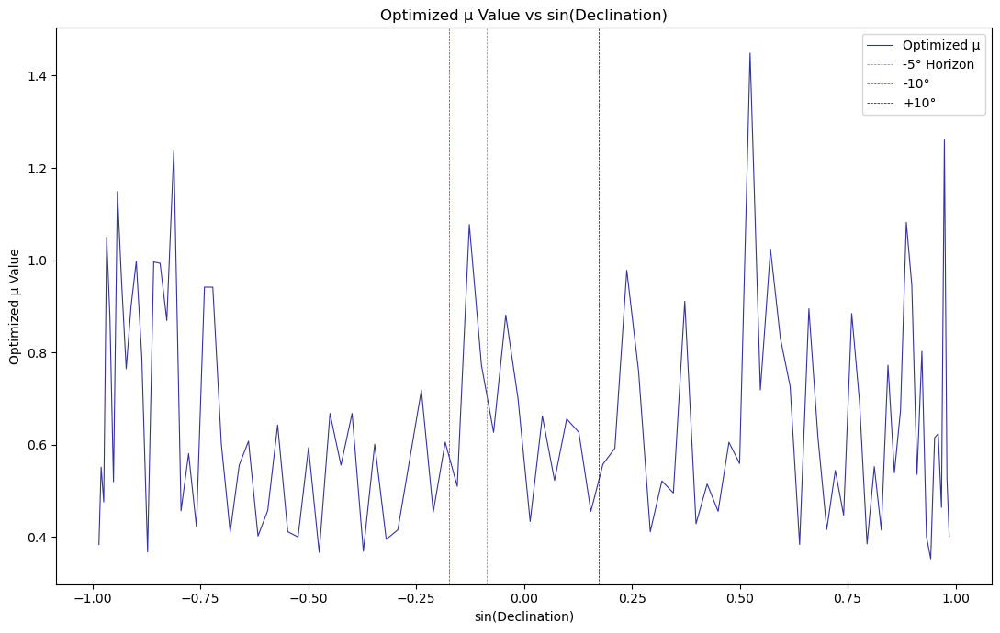

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Optimized_μ_Value_vs_sin(Declination)_bins_100.png


In [148]:
import json
import numpy as np
import matplotlib.pyplot as plt

# # Load the saved data for 1000 bins
# with open('optimized_mu_values_p_values_1000_bins.json', 'r') as f:
#     data = json.load(f)
# Load the saved data for other bin
with open('optimized_mu_values_p_values.json', 'r') as f:
    data = json.load(f)
# Extract the data
sin_x_midpoints = np.array(data['sin_x_midpoints'])
optimised_mu_values = np.array(data['optimized_mu_values'])
optimised_p_values = np.min(np.array(data['optimised_p_values']), axis=1)


fig, ax = plt.subplots(figsize=(11, 7))

# Plot the data
ax.plot(sin_x_midpoints, optimised_mu_values, color='darkblue', label='Optimized μ', linewidth=.8, alpha=0.8)

# Mark the declinations with vertical lines
ax.axvline(x=np.sin(np.radians(-5)), color='grey', linestyle='--', linewidth=.5, label='-5° Horizon')
ax.axvline(x=np.sin(np.radians(-10)), color='green', linestyle='--', linewidth=.5, label='-10°')
ax.axvline(x=np.sin(np.radians(10)), color='black', linestyle='--', linewidth=.5, label='+10°')

# Set labels and title
ax.set_xlabel('sin(Declination)')
ax.set_ylabel('Optimized μ Value')
ax.set_title('Optimized μ Value vs sin(Declination)')

# Configure grid, legend, and layout
ax.grid(False)
ax.legend()
fig.tight_layout()

# Save and show the plot
plt.show()
save_plot(fig, ax, datapick)


Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/p_values_vs_sin(Declination)_using_optimised_μ_bins_100.png


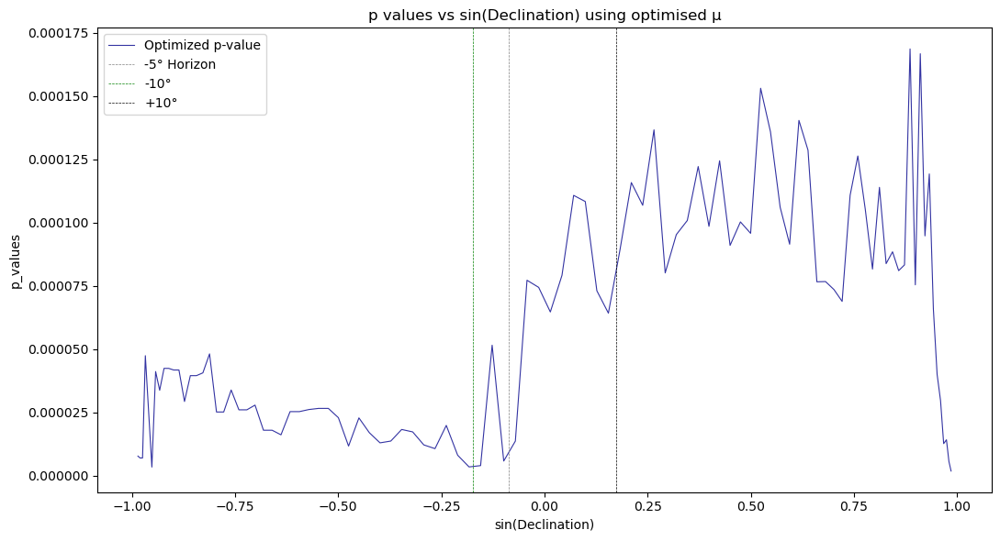

In [150]:
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(11, 6))

# Plotting the data
ax.plot(sin_x_midpoints, optimised_p_values, color='darkblue', label='Optimized p-value', linewidth=.8, alpha=0.8)

# Mark the -5°, -10°, and +10° declinations
ax.axvline(x=np.sin(np.radians(-5)), color='grey', linestyle='--', linewidth=.5, label='-5° Horizon')
ax.axvline(x=np.sin(np.radians(-10)), color='green', linestyle='--', linewidth=.5, label='-10°')
ax.axvline(x=np.sin(np.radians(10)), color='black', linestyle='--', linewidth=.5, label='+10°')

# Set labels, title, and other properties
ax.set_xlabel('sin(Declination)')
ax.set_ylabel('p_values')
ax.set_title('p values vs sin(Declination) using optimised μ')
ax.grid(False)
ax.legend()
plt.tight_layout()

# Save and show the plot
save_plot(fig, ax, datapick)
plt.show()

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Frequentest_vs_Fitted_P_Values_(μ_=_0.5)_bins_100.png


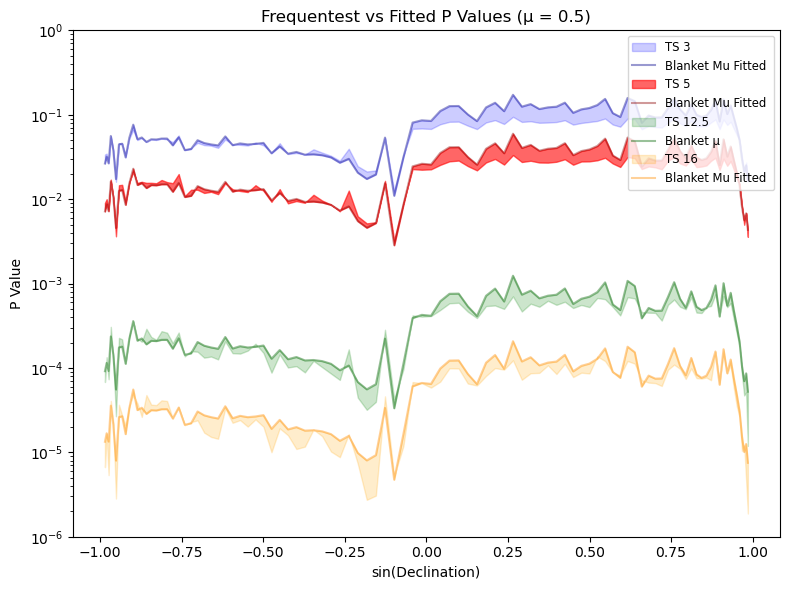

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Frequentest_vs_Fitted_P_Values_(μ_=_1)_bins_100.png


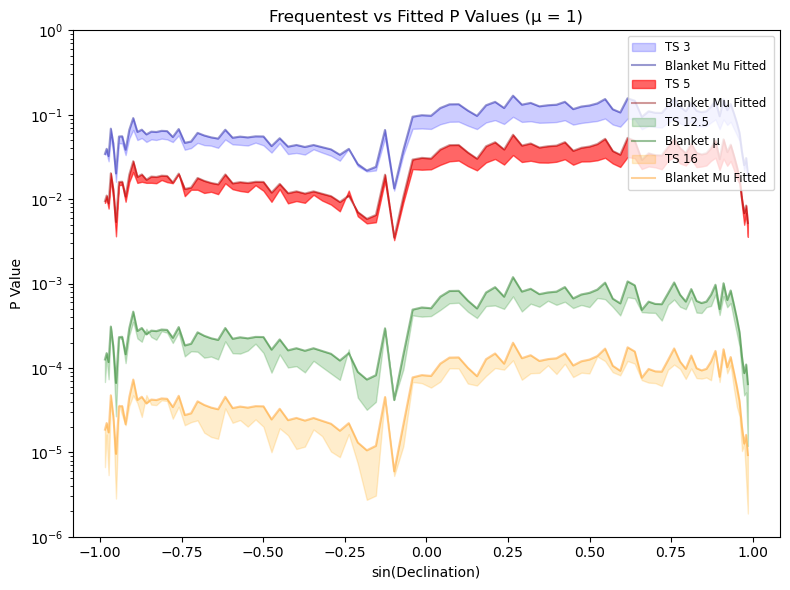

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Frequentest_vs_Fitted_P_Values_(μ_=_1.5)_bins_100.png


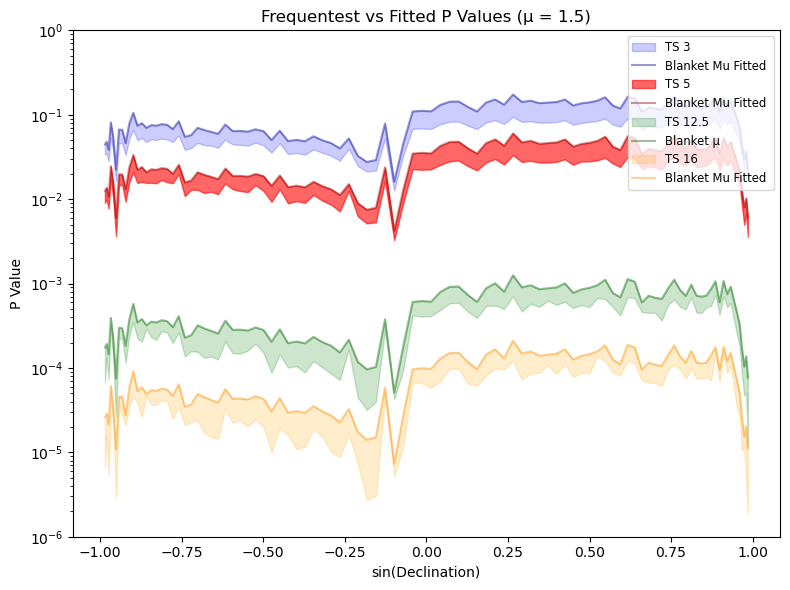

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Frequentest_vs_Fitted_P_Values_(μ_=_2)_bins_100.png


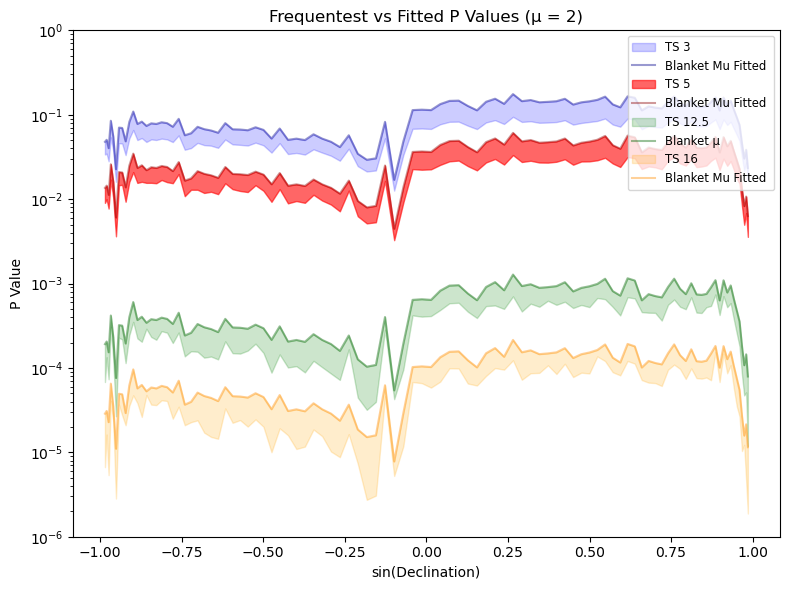

In [137]:
#~Working~#    Frequentest vs Fitted P Values   # Mu cutter 1.0
#~~~~~~~~~#=====================================#
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2

# Access the individual arrays
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Function to find the critical p-value for a given TS value
def find_critical_p_value(cumulative_distribution, ts_value, y_edges):
    if ts_value < y_edges[0] or ts_value > y_edges[-1]:
        raise ValueError("TS value is out of the range of y_edges.")
    
    critical_index = np.searchsorted(y_edges, ts_value, side='left')
    
    if critical_index == len(y_edges):
        return 0.0
    elif critical_index == 0:
        return 1.0
    
    y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
    p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]
    
    slope = (p1 - p0) / (y1 - y0)
    p_value = p0 + slope * (ts_value - y0)
    
    total_trials = cumulative_distribution[0]
    p_value = p_value / total_trials
    
    return p_value

# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)

# Convert declination edges to sine of declination
sin_x_edges = np.sin(np.radians(x_edges))

# List of TS values to investigate
mu_values = [0.5, 1, 1.5, 2]


# Loop over mu values
for i, mu in enumerate(mu_values):
    sin_x_midpoints = []
    frequentist_ts_3 = []
    fitted_ts_3 = []
    frequentist_ts_5 = []
    fitted_ts_5 = []
    frequentist_ts_12_5 = []
    fitted_ts_12_5 = []
    frequentist_ts_16 = []
    fitted_ts_16 = []
    
    for idx in range(len(x_edges) - 1):
        total_counts = np.sum(histogram_2d[idx, :])
        if total_counts > 0:
            normalized_histogram = histogram_2d[idx, :] / total_counts
            cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
            total_trials_norm = cumulative_sum_norm_hist[0]
            fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm

            filtered_mask = y_edges[:-1] >= mu
            filtered_y_edges = y_edges[:-1][filtered_mask]
            filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

            # Fit the chi-squared model to the valid data
            popt, _ = curve_fit(chi_squared_model, filtered_y_edges, filtered_fraction_above_ts_norm, p0=[2.0], maxfev=10000)
            df = popt[0]

            # Calculate and store the empirical and fitted values for specific TS values
            for ts_value, emp_list, fitted_list in [
                (3, frequentist_ts_3, fitted_ts_3), 
                (5, frequentist_ts_5, fitted_ts_5), 
                (12.5, frequentist_ts_12_5, fitted_ts_12_5),
                (16, frequentist_ts_16, fitted_ts_16)
            ]:
                # Frequentist p-value
                empirical_p_value = find_critical_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
                emp_list.append(empirical_p_value)

                # Fitted p-value using chi-squared model
                fitted_p_value = chi2.sf(ts_value, df)
                fitted_list.append(fitted_p_value)

            # Store the midpoint of sin(declination)
            sin_x_midpoints.append((sin_x_edges[idx] + sin_x_edges[idx + 1]) / 2)
    # Clip y-values to ensure they are not below 10^-8
    frequentist_ts_3 = np.clip(frequentist_ts_3, 1e-8, None)
    fitted_ts_3 = np.clip(fitted_ts_3, 1e-8, None)
    
    frequentist_ts_5 = np.clip(frequentist_ts_5, 1e-8, None)
    fitted_ts_5 = np.clip(fitted_ts_5, 1e-8, None)
    
    frequentist_ts_12_5 = np.clip(frequentist_ts_12_5, 1e-8, None)
    fitted_ts_12_5 = np.clip(fitted_ts_12_5, 1e-8, None)
    
    frequentist_ts_16 = np.clip(frequentist_ts_16, 1e-8, None)
    fitted_ts_16 = np.clip(fitted_ts_16, 1e-8, None)
    # Create a new figure and axis for each mu value
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_ylim(1e-6,None)
    
    # Plot for each sigma level with fill_between
    ax.fill_between(sin_x_midpoints, frequentist_ts_3, fitted_ts_3, color='blue', alpha=0.2, label='TS 3 ')
    ax.plot(sin_x_midpoints, fitted_ts_3, color='darkblue', linestyle='-', alpha=0.4, label='Blanket Mu Fitted')
    
    ax.fill_between(sin_x_midpoints, frequentist_ts_5, fitted_ts_5, color='red', alpha=0.6, label='TS 5')
    ax.plot(sin_x_midpoints, fitted_ts_5, color='darkred', linestyle='-', alpha=0.4, label='Blanket Mu Fitted ')
    
    ax.fill_between(sin_x_midpoints, frequentist_ts_12_5, fitted_ts_12_5, color='green', alpha=0.2, label='TS 12.5')
    ax.plot(sin_x_midpoints, fitted_ts_12_5, color='darkgreen', linestyle='-', alpha=0.4, label='Blanket μ')
    
    ax.fill_between(sin_x_midpoints, frequentist_ts_16, fitted_ts_16, color='orange', alpha=0.2, label='TS 16')
    ax.plot(sin_x_midpoints, fitted_ts_16, color='darkorange', linestyle='-', alpha=0.4, label='Blanket Mu Fitted ')

    ax.axhline(y=0, color='grey', linestyle='--', linewidth=0.5)
    ax.set_xlabel('sin(Declination)')
    ax.set_ylabel('P Value')
    ax.set_yscale('log')
    ax.set_title(f'Frequentest vs Fitted P Values (μ = {mu})')
    ax.legend(loc='upper right', fontsize='small')
    ax.grid(False)
    plt.tight_layout()

    # Save and show the plot
    save_plot(fig, ax, datapick)
    plt.show()

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Sin(Declination)_vs_P_Values_with_Various_Blanket_μ_cuts_and_Frequentist_comparison_bins_100.png


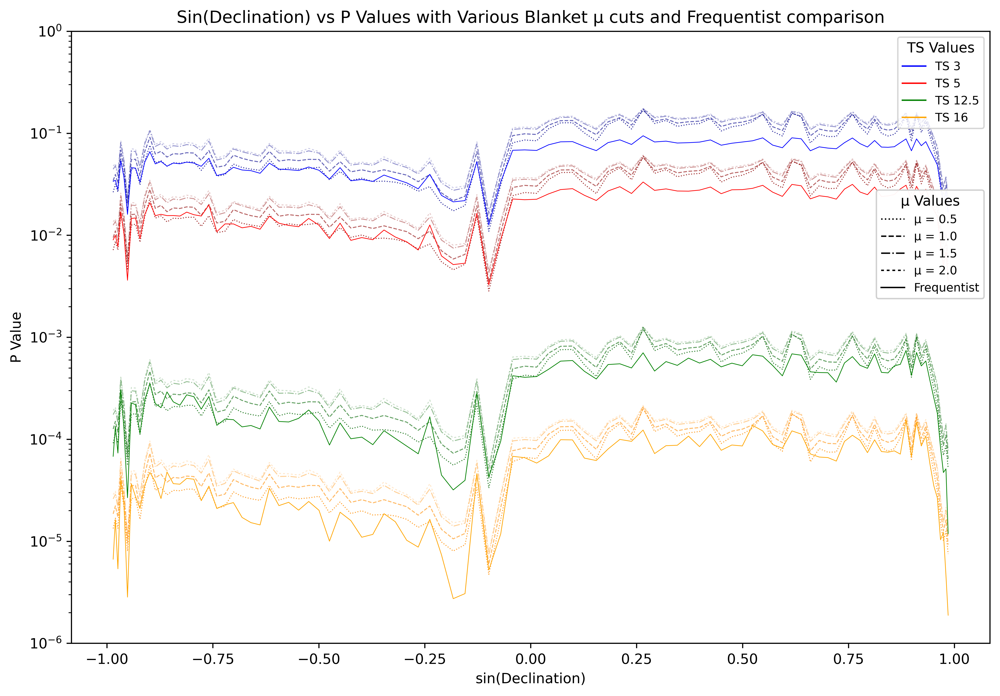

In [153]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from scipy.stats import chi2
from matplotlib.lines import Line2D
# Access the individual arrfrom matplotlib.lin
histogram_2d = data['histogram_2d']
x_edges = data['x_edges']
y_edges = data['y_edges']

# Function to find the critical p-value for a given TS value
def find_critical_p_value(cumulative_distribution, ts_value, y_edges):
    if ts_value < y_edges[0] or ts_value > y_edges[-1]:
        raise ValueError("TS value is out of the range of y_edges.")
    
    critical_index = np.searchsorted(y_edges, ts_value, side='left')
    
    if critical_index == len(y_edges):
        return 0.0
    elif critical_index == 0:
        return 1.0
    
    y0, y1 = y_edges[critical_index - 1], y_edges[critical_index]
    p0, p1 = cumulative_distribution[critical_index - 1], cumulative_distribution[critical_index]
    
    slope = (p1 - p0) / (y1 - y0)
    p_value = p0 + slope * (ts_value - y0)
    
    total_trials = cumulative_distribution[0]
    p_value = p_value / total_trials
    
    return p_value

# Chi-squared model function
def chi_squared_model(k, df):
    return chi2.pdf(k, df)

# Convert declination edges to sine of declination
sin_x_edges = np.sin(np.radians(x_edges))

# List of TS values to investigate
mu_values = [0.5, 1, 1.5, 2]
line_styles = [':', '--', '-.', (0, (2, 2))]
alphas = [0.8, 0.6, 0.4, 0.2]

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 7), dpi=600)
ax.set_ylim(1e-6, None)

# Loop over mu values
for i, mu in enumerate(mu_values):
    sin_x_midpoints = []
    frequentist_ts_3 = []
    fitted_ts_3 = []
    frequentist_ts_5 = []
    fitted_ts_5 = []
    frequentist_ts_12_5 = []
    fitted_ts_12_5 = []
    frequentist_ts_16 = []
    fitted_ts_16 = []
    
    for idx in range(len(x_edges) - 1):
        total_counts = np.sum(histogram_2d[idx, :])
        if total_counts > 0:
            normalized_histogram = histogram_2d[idx, :] / total_counts
            cumulative_sum_norm_hist = np.cumsum(normalized_histogram[::-1])[::-1]
            total_trials_norm = cumulative_sum_norm_hist[0]
            fraction_above_ts_norm = cumulative_sum_norm_hist / total_trials_norm

            filtered_mask = y_edges[:-1] >= mu
            filtered_y_edges = y_edges[:-1][filtered_mask]
            filtered_fraction_above_ts_norm = fraction_above_ts_norm[filtered_mask]

            # Fit the chi-squared model to the valid data
            popt, _ = curve_fit(chi_squared_model, filtered_y_edges, filtered_fraction_above_ts_norm, p0=[2.0], maxfev=10000)
            df = popt[0]

            # Calculate and store the empirical and fitted values for specific TS values
            for ts_value, emp_list, fitted_list in [
                (3, frequentist_ts_3, fitted_ts_3), 
                (5, frequentist_ts_5, fitted_ts_5), 
                (12.5, frequentist_ts_12_5, fitted_ts_12_5),
                (16, frequentist_ts_16, fitted_ts_16)
            ]:
                # Frequentist p-value
                empirical_p_value = find_critical_p_value(cumulative_sum_norm_hist, ts_value, y_edges[:-1])
                emp_list.append(empirical_p_value)

                # Fitted p-value using chi-squared model
                fitted_p_value = chi2.sf(ts_value, df)
                fitted_list.append(fitted_p_value)

            # Store the midpoint of sin(declination)
            sin_x_midpoints.append((sin_x_edges[idx] + sin_x_edges[idx + 1]) / 2)
    
    # Clip y-values to ensure they are not below 10^-8
    frequentist_ts_3 = np.clip(frequentist_ts_3, 1e-8, None)
    fitted_ts_3 = np.clip(fitted_ts_3, 1e-8, None)
    
    frequentist_ts_5 = np.clip(frequentist_ts_5, 1e-8, None)
    fitted_ts_5 = np.clip(fitted_ts_5, 1e-8, None)
    
    frequentist_ts_12_5 = np.clip(frequentist_ts_12_5, 1e-8, None)
    fitted_ts_12_5 = np.clip(fitted_ts_12_5, 1e-8, None)
    
    frequentist_ts_16 = np.clip(frequentist_ts_16, 1e-8, None)
    fitted_ts_16 = np.clip(fitted_ts_16, 1e-8, None)
    # Plot the fitted curves with varying line styles and alphas
    ax.plot(sin_x_midpoints, fitted_ts_3, color='darkblue', linestyle=line_styles[i], alpha=alphas[i],linewidth= 0.7)
    ax.plot(sin_x_midpoints, fitted_ts_5, color='darkred', linestyle=line_styles[i], alpha=alphas[i], linewidth= 0.7)
    ax.plot(sin_x_midpoints, fitted_ts_12_5, color='darkgreen', linestyle=line_styles[i], alpha=alphas[i],linewidth= 0.7)
    ax.plot(sin_x_midpoints, fitted_ts_16, color='darkorange', linestyle=line_styles[i], alpha=alphas[i],linewidth= 0.7)

# Plot the frequentist lines in solid style
ax.plot(sin_x_midpoints, frequentist_ts_3, color='blue', linestyle='-', linewidth= 0.5 )
ax.plot(sin_x_midpoints, frequentist_ts_5, color='red', linestyle='-',linewidth= 0.5 )
ax.plot(sin_x_midpoints, frequentist_ts_12_5, color='green', linestyle='-',linewidth= 0.5 )
ax.plot(sin_x_midpoints, frequentist_ts_16, color='orange', linestyle='-', linewidth= 0.5)

# Custom legend for TS values (color) and mu values (linestyle)
legend_lines = [
    Line2D([0], [0], color='blue', lw=1, label='TS 3'),
    Line2D([0], [0], color='red', lw=1, label='TS 5'),
    Line2D([0], [0], color='green', lw=1, label='TS 12.5'),
    Line2D([0], [0], color='orange', lw=1, label='TS 16')
]

legend_styles = [
    Line2D([0], [0], color='black', linestyle=':', lw=1, label='μ = 0.5'),
    Line2D([0], [0], color='black', linestyle='--', lw=1, label='μ = 1.0'),
    Line2D([0], [0], color='black', linestyle='-.', lw=1, label='μ = 1.5'),
    Line2D([0], [0], color='black', linestyle=(0, (2, 2)), lw=1, label='μ = 2.0'),
    Line2D([0], [0], color='black', linestyle='-', lw=1, label='Frequentist')
]

# Add the legend for TS values (color)
first_legend = ax.legend(handles=legend_lines, loc='upper right', fontsize='small', title='TS Values')
ax.add_artist(first_legend)  # Add the first legend manually

# Add the legend for mu values (linestyle)
second_legend = ax.legend(handles=legend_styles, loc='upper right', fontsize='small', bbox_to_anchor=(1, 0.75), title='μ Values')
ax.add_artist(second_legend)  
ax.axhline(y=0, color='grey', linestyle='--', linewidth=0.5)
ax.set_xlabel('sin(Declination)')
ax.set_ylabel('P Value')
ax.set_yscale('log')
ax.set_title('Sin(Declination) vs P Values with Various Blanket μ cuts and Frequentist comparison', fontsize=12)
ax.grid(False)
plt.tight_layout()

# Save and show the plot
save_plot(fig, ax, datapick)
plt.show()

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/P-value_vs_sin(Declination)_for_TS_=_16__bins_100.png


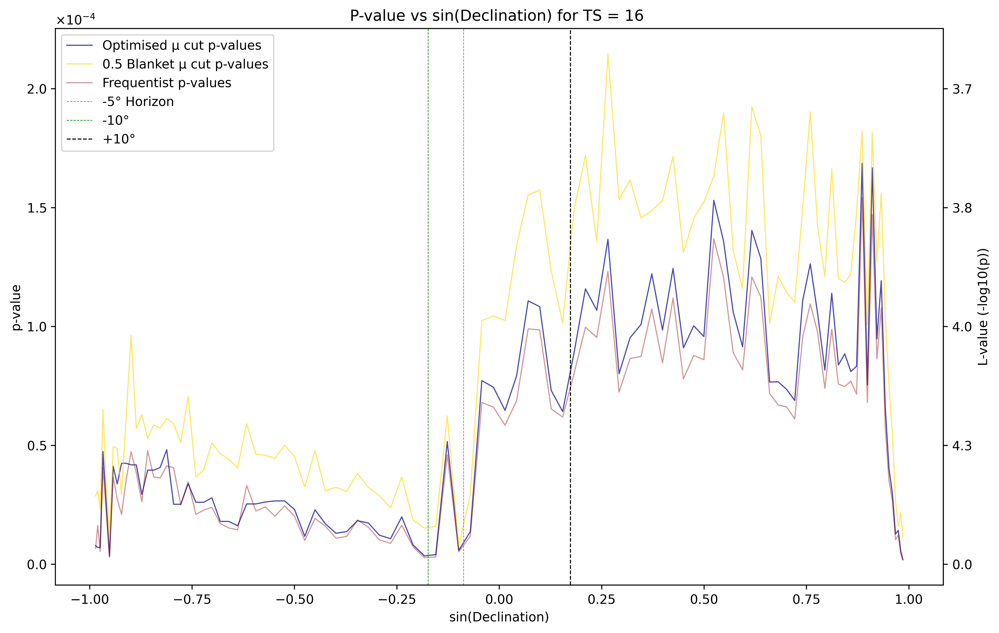

In [167]:
#~~~~~~~~~#=====================================#
#~Working~# P value Comparison with blanket mu  #
#~~~~~~~~~#=====================================#
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter, FuncFormatter
with open('optimized_mu_values_p_values.json', 'r') as f:
    data = json.load(f)
# Extract the data
sin_x_midpoints = np.array(data['sin_x_midpoints'])
# Assuming data['optimised_p_values'] is a 2D array where each row corresponds to a different `sin_x_midpoint`
optimised_ts_16 = np.min(np.array(data['optimised_p_values']), axis=1)
# Function to convert p-values to L-values
def p_to_L(p):
    # If p is a single value (scalar)
    if np.isscalar(p):
        if p < 0:
            p = abs(p)  # Take the absolute value if it's negative
        elif p == 0:
            return 0  # Return zero if p_value is zero
        return -np.log10(p)
    # If p is an array, handle it element-wise
    else:
        p = np.abs(p)  # Take the absolute value of all p_values if any are negative
        L = np.zeros_like(p)  # Initialize L with zeros
        non_zero_mask = p != 0  # Identify non-zero elements
        L[non_zero_mask] = -np.log10(p[non_zero_mask])  # Apply log10 only to non-zero elements
        return L
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(11, 7), dpi=600)

# Plotting the data
ax.plot(sin_x_midpoints, optimised_ts_16, color='Darkblue', label='Optimised μ cut p-values', linewidth=0.9, alpha=0.7)
ax.plot(sin_x_midpoints, fitted_ts_16, color='gold', linestyle='-', alpha=0.6, linewidth=0.9, label='0.5 Blanket μ cut p-values')
ax.plot(sin_x_midpoints, frequentist_ts_16, color='darkred', linestyle='-', alpha=0.4, linewidth=0.9, label='Frequentist p-values')

# Mark the -5°, -10°, and +10° declinations
ax.axvline(x=np.sin(np.radians(-5)), color='grey', linestyle='--', linewidth=.5, label='-5° Horizon')
ax.axvline(x=np.sin(np.radians(-10)), color='green', linestyle='--', linewidth=.5, label='-10°')
ax.axvline(x=np.sin(np.radians(10)), color='black', linestyle='--', linewidth=.8, label='+10°')

# Set labels, title, and other properties
ax.set_xlabel('sin(Declination)')
ax.set_ylabel('p-value')
ax.set_title('P-value vs sin(Declination) for TS = 16 ')
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

# Create a secondary y-axis for L-values
secax = ax.secondary_yaxis('right')
secax.set_ylabel('L-value (-log10(p))')

# Get current y-ticks from the left y-axis
left_ticks = ax.get_yticks()

# Convert the left y-tick values (p-values) to L-values
l_ticks = p_to_L(left_ticks)

# Set the right y-axis ticks at the same positions as the left y-axis ticks
secax.set_yticks(left_ticks)

# Set the labels on the right y-axis to the corresponding L-values
secax.set_yticklabels([f'{L:.1f}' for L in l_ticks])

# Plot the grid and legend
ax.grid(False)
ax.legend()
plt.tight_layout()
save_plot(fig, ax, datapick)
# Save and show the plot
plt.show()


Primary y-axis tick values (p-values): [-5.0e-05  0.0e+00  5.0e-05  1.0e-04  1.5e-04  2.0e-04  2.5e-04]
Converted L-values: [ 4.30103    -0.          4.30103     4.          3.82390874  3.69897
  3.60205999]
Manually set secondary y-axis tick values (L-values): [ 4.30103    -0.          4.30103     4.          3.82390874  3.69897
  3.60205999]
Secondary y-axis labels displayed:
4.3
-0.0
4.3
4.0
3.8
3.7
3.6


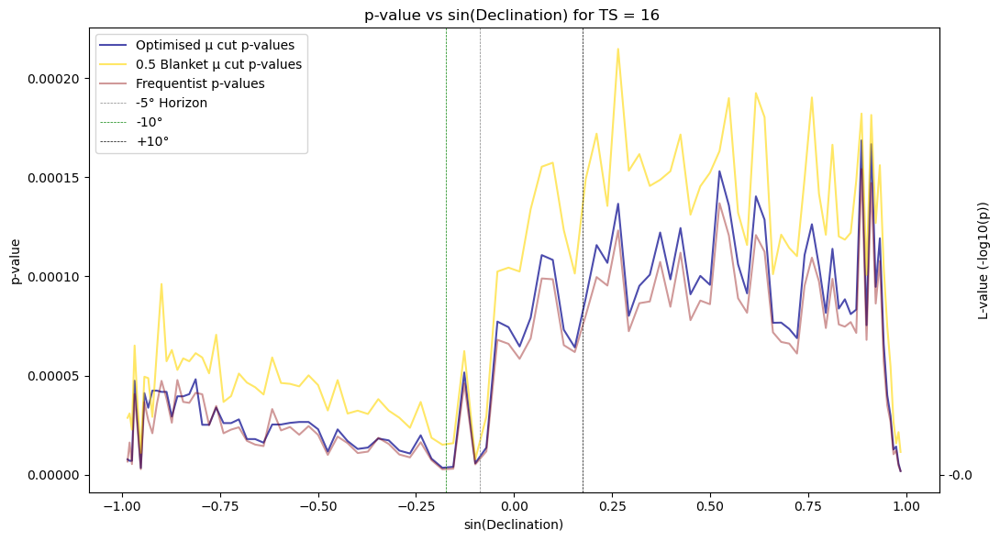

ticks:  [-4.e-05 -2.e-05  0.e+00  2.e-05  4.e-05  6.e-05  8.e-05  1.e-04]
L_ticks:  [np.float64(4.3979400086720375), np.float64(4.698970004336019), 0, np.float64(4.698970004336019), np.float64(4.3979400086720375), np.float64(4.221848749616356), np.float64(4.096910013008056), np.float64(4.0)]
Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Relative_Differences:_Optimised_and_Blanket_μ_cut_vs_Frequentist_p-values_bins_100.png


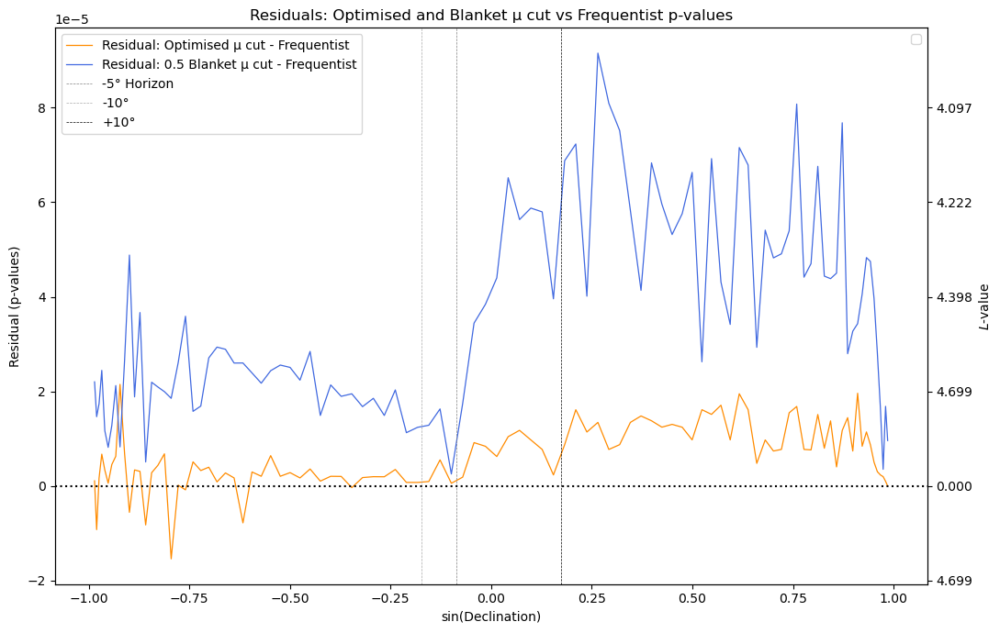

In [163]:
#~~~~~~~~~#==========================================================#
#~Working~# Residuals: Optimised and Fitted vs Frequentist p-values  #
#~~~~~~~~~#==========================================================#
import json
import numpy as np
import matplotlib.pyplot as plt


# Extract the data
sin_x_midpoints = np.array(data['sin_x_midpoints'])
optimised_p_values = np.min(np.array(data['optimised_p_values']), axis=1)

# Convert lists to numpy arrays
fitted_p_values = np.array(fitted_ts_16)
frequentist_p_values = np.array(frequentist_ts_16)

# Compute residuals
residual_optimised = optimised_p_values - frequentist_p_values
residual_fitted = fitted_p_values - frequentist_p_values

# Convert residual p-values to L values for plotting
def p_value_to_L_value(p_value):
    if p_value < 0:
        p_value = abs(p_value)  # Take the absolute value of p_value if it's negative
    elif p_value == 0:
        return 0  # Return zero if p_value is zero

    # Define the transformation from p-value to L-value
    L_value = -np.log10(p_value)
    return L_value

# Plot residuals
fig, ax1 = plt.subplots(figsize=(11, 7))

# Primary y-axis (p-values)
ax1.set_xlabel('sin(Declination)')
ax1.set_ylabel('Residual (p-values)', color='black')
ax1.plot(sin_x_midpoints, residual_optimised, color='darkorange', linestyle='-', label='Residual: Optimised μ cut - Frequentist', linewidth=.9)
ax1.plot(sin_x_midpoints, residual_fitted, color='royalblue', linestyle='-', label='Residual: 0.5 Blanket μ cut - Frequentist', linewidth=.9)
ax1.tick_params(axis='y', labelcolor='black')
ax1.legend(loc='upper left')

# Set up secondary y-axis (L-values)
ax2 = ax1.twinx()
ticks = ax1.get_yticks()
L_ticks = [p_value_to_L_value(tick) for tick in ticks]
print('ticks: ',ticks)
print('L_ticks: ',L_ticks)
ax2.set_yticks(ticks)  # Set the ticks on the secondary y-axis
ax2.set_yticklabels([f'{L:.3f}' for L in L_ticks])
ax2.set_ylabel(r'$L$-value', color='black')
ax2.plot(sin_x_midpoints, residual_optimised, color='red', linestyle='--', linewidth=.001)
ax2.plot(sin_x_midpoints, residual_fitted, color='green', linestyle='--', linewidth=.001)
ax2.tick_params(axis='y', labelcolor='black')

# Mark the -5°, -10°, and +10° declinations
ax1.axvline(x=np.sin(np.radians(-5)), color='grey', linestyle='--', linewidth=.5, label='-5° Horizon')
ax1.axvline(x=np.sin(np.radians(-10)), color='darkgrey', linestyle='--', linewidth=.5, label='-10°')
ax1.axvline(x=np.sin(np.radians(10)), color='black', linestyle='--', linewidth=.5, label='+10°')
ax1.axhline(0, color='black', linestyle=':')
fig.tight_layout()
plt.title('Residuals: Optimised and Blanket μ cut vs Frequentist p-values')
plt.grid(False)

# Handle legends manually to avoid empty legend warnings
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1, labels1, loc='upper left')
ax2.legend(lines2, labels2, loc='upper right')

# Save and show the plot
plt.tight_layout()
save_plot(fig, ax, datapick)

plt.show()


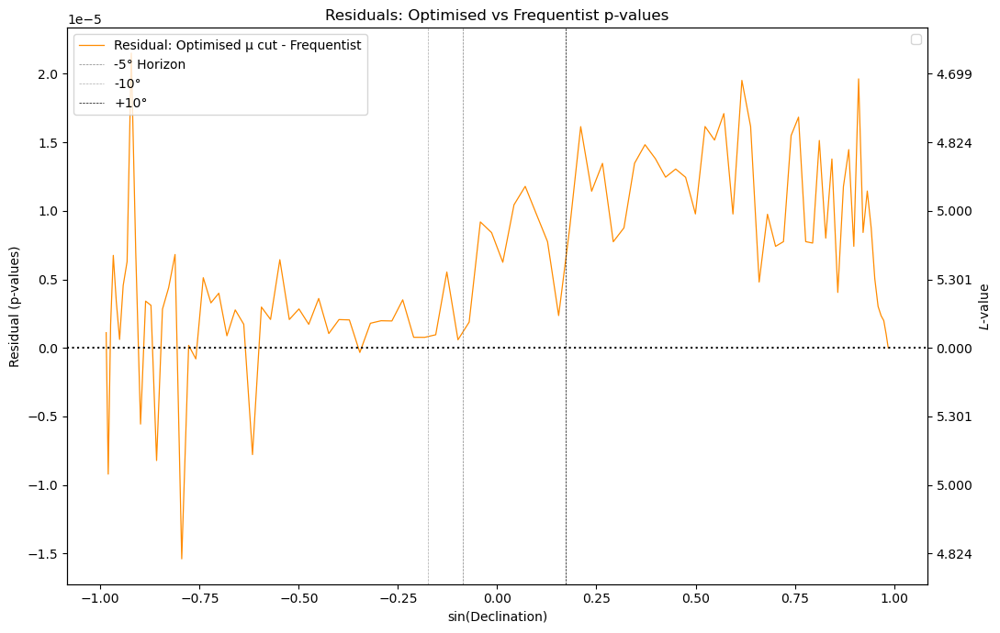

In [159]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Extract the data
sin_x_midpoints = np.array(data['sin_x_midpoints'])
optimised_p_values = np.min(np.array(data['optimised_p_values']), axis=1)

# Convert lists to numpy arrays
fitted_p_values = np.array(fitted_ts_16)
frequentist_p_values = np.array(frequentist_ts_16)

# Compute residuals
residual_optimised = optimised_p_values - frequentist_p_values
#residual_fitted = fitted_p_values - frequentist_p_values

# Convert residual p-values to L values for plotting
def p_value_to_L_value(p_value):
    if p_value < 0:
        p_value = abs(p_value)  # Take the absolute value of p_value if it's negative
    elif p_value == 0:
        return 0  # Return zero if p_value is zero

    # Define the transformation from p-value to L-value
    L_value = -np.log10(p_value)
    return L_value

# Plot residuals
fig, ax1 = plt.subplots(figsize=(11, 7))

# Primary y-axis (p-values)
ax1.set_xlabel('sin(Declination)')
ax1.set_ylabel('Residual (p-values)', color='black')
ax1.plot(sin_x_midpoints, residual_optimised, color='darkorange', linestyle='-', label='Residual: Optimised μ cut - Frequentist', linewidth=.9)
#ax1.plot(sin_x_midpoints, residual_fitted, color='royalblue', linestyle='-', label='Residual: Fitted - Frequentist', linewidth=.9)
ax1.tick_params(axis='y', labelcolor='black')
ax1.legend(loc='upper left')

# Set up secondary y-axis (L-values)
ax2 = ax1.twinx()
ticks = ax1.get_yticks()
L_ticks = [p_value_to_L_value(tick) for tick in ticks]
ax2.set_yticks(ticks)  # Set the ticks on the secondary y-axis
ax2.set_yticklabels([f'{L:.3f}' for L in L_ticks])
ax2.set_ylabel(r'$L$-value', color='black')
ax2.plot(sin_x_midpoints, residual_optimised, color='red', linestyle='--', linewidth=.001)
#ax2.plot(sin_x_midpoints, residual_fitted, color='green', linestyle='--', linewidth=.001)
ax2.tick_params(axis='y', labelcolor='black')

# Mark the -5°, -10°, and +10° declinations
ax1.axvline(x=np.sin(np.radians(-5)), color='grey', linestyle='--', linewidth=.5, label='-5° Horizon')
ax1.axvline(x=np.sin(np.radians(-10)), color='darkgrey', linestyle='--', linewidth=.5, label='-10°')
ax1.axvline(x=np.sin(np.radians(10)), color='black', linestyle='--', linewidth=.5, label='+10°')
ax1.axhline(0, color='black', linestyle=':')
fig.tight_layout()
plt.title('Residuals: Optimised vs Frequentist p-values')
plt.grid(False)

# Handle legends manually to avoid empty legend warnings
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1, labels1, loc='upper left')
ax2.legend(lines2, labels2, loc='upper right')

# Save and show the plot
plt.tight_layout()

plt.show()

Plot saved as /tmp/hsperfdata_kennedyc/ProjectImages/Relative_Differences:_Optimised_and_Blanket_μ_cut_vs_Frequentist_p-values_bins_100.png


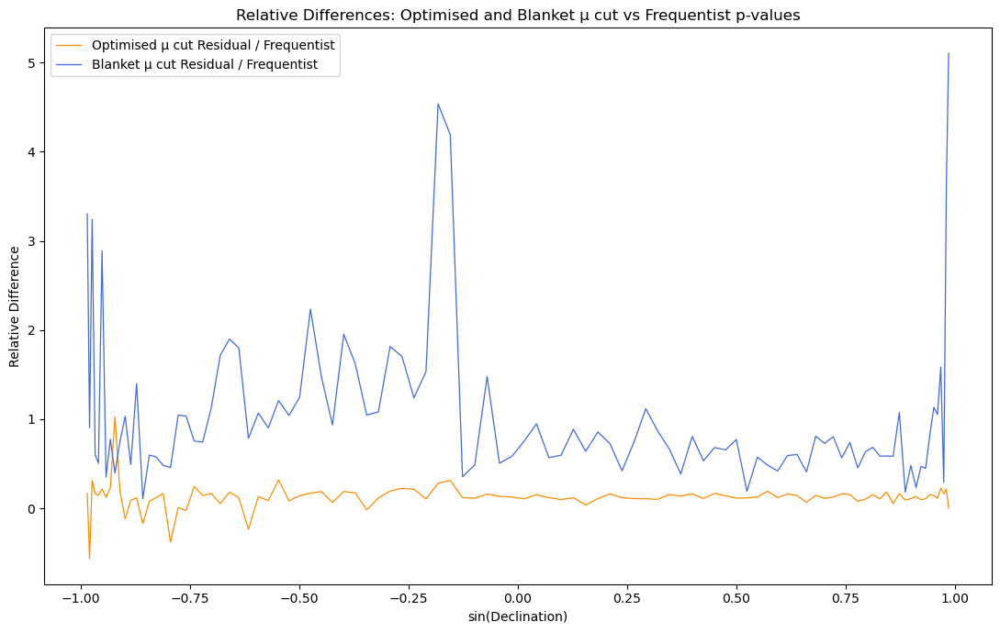

In [162]:
# Compute residuals
residual_optimised = optimised_p_values - frequentist_p_values
# Calculate relative differences (handle cases where division by zero might occur)
relative_difference_optimised = (optimised_p_values - frequentist_p_values )/ frequentist_p_values
relative_difference_fitted = (fitted_p_values - frequentist_p_values) / frequentist_p_values




# Plot relative differences
fig, ax = plt.subplots(figsize=(11, 7))
ax.set_xlabel('sin(Declination)')
ax.set_ylabel('Relative Difference', color='black')
ax.plot(sin_x_midpoints, relative_difference_optimised, color='darkorange', linestyle='-', label='Optimised μ cut Residual / Frequentist', linewidth=.9)
ax.plot(sin_x_midpoints, relative_difference_fitted, color='royalblue', linestyle='-', label='Blanket μ cut Residual / Frequentist', linewidth=.9)
ax.legend(loc='upper left')
plt.title('Relative Differences: Optimised and Blanket μ cut vs Frequentist p-values')
plt.grid(False)
plt.tight_layout()
save_plot(fig, ax, datapick)

plt.show()

